### Members
***
+ UID: 205928946, name: Yu-Wei Chen
+ UID: 705668757, name: Kuei-Chun Huang
+ UID: 805861373, name: Sinya Peng

In [154]:
# TODO: update packages
# !pip install matplotlib==3.6.0
# !pip install scikit-learn==1.2.0
# !pip install umap-learn
# !pip install pandas matplotlib datashader bokeh holoviews colorcet scikit-image
# !pip install umap-learn[plot]
# !pip install holoviews
# !pip install sentence_transformers

# Reference to: https://github.com/lmcinnes/umap/issues/405

In [155]:
import os
import random  
import requests
import tarfile

from collections import Counter, defaultdict
from typing import Callable, Dict, List, Tuple

# show image dimension
import imageio.v2 as iio  
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# torch libraries
import torch
import torch.nn as nn
# umap dimension reduction
import umap.umap_ as umap

# hdbscan dimension reduction
from hdbscan import HDBSCAN
from multiprocessing import Pool
from scipy import stats
from scipy.optimize import linear_sum_assignment
from sentence_transformers import SentenceTransformer
# sklearn libraries
from sklearn.base import TransformerMixin
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.metrics.cluster import (
    adjusted_mutual_info_score,
    adjusted_rand_score,
    completeness_score,
    contingency_matrix,
    homogeneity_score,
    v_measure_score,
)
from sklearn.preprocessing import LabelEncoder
# torch libraries
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, TensorDataset
from tqdm.auto import tqdm

from plotmat import plot_mat

In [3]:
SEED = 0

np.random.seed(SEED)
os.environ["CUDA_VISIBLE_DEVICES"] = "2"  # set gpu device
plt.style.use("seaborn-bright")
random.seed(SEED)

/tmp/ipykernel_13682/1348330346.py:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-bright")


# Part 1 - Clustering on Text Data

In [4]:
categories = [
    "comp.graphics",
    "comp.os.ms-windows.misc",
    "comp.sys.ibm.pc.hardware",
    "comp.sys.mac.hardware",
    "rec.autos",
    "rec.motorcycles",
    "rec.sport.baseball",
    "rec.sport.hockey",
]

newsgroups_subset = fetch_20newsgroups(
    subset="all", categories=categories, remove=("headers", "footers")
)

X_subset = newsgroups_subset["data"]
y_subset_text = [
    newsgroups_subset["target_names"][y].split(".")[0]
    for y in newsgroups_subset["target"]
]
le = LabelEncoder()
y_subset = le.fit_transform(y_subset_text)  # '0': comp, '1': rec

len(X_subset), len(y_subset), Counter(y_subset)

(7882, 7882, Counter({0: 3903, 1: 3979}))

In [5]:
tfidf = TfidfVectorizer(stop_words="english", min_df=3)
X_subset_tfidf = tfidf.fit_transform(X_subset)
X_subset_tfidf.shape

(7882, 23522)

### QUESTION 1: Report the dimensions of the TF-IDF matrix you obtain.
***
> Ans: The matrix has 7882 rows and 23522 columns.

In [6]:
def run_evaluate_pipeline(X: np.ndarray, 
                          y: np.ndarray, 
                          pred_func: Callable, 
                          n_clusters: int, 
                          fig_size: Tuple[int, int],
                          plot_figure: bool=True,
                         ) -> Dict:
    """
    Generate report for the given X and clustering method.
    
    Parameters
    ----------
    X: np.ndarray, the input vectors.
    y: np.ndarray, ground truth labels.
    pred_func: Callable, the clustering and predicting function.
    n_clusters: int, number of clusters.
    fig_size: tuple(int, int), the figure size of contingency matrix.
    
    Return
    ------
    scores: dict, contingency matrix and five clustering scores.
    """
    y_pred = pred_func(X, n_clusters=n_clusters)
    scores = get_cluster_scores(y, y_pred)
    rows, cols = linear_sum_assignment(scores["contingency_matrix"], maximize=True)
    if plot_figure:
        plot_mat(
            scores["contingency_matrix"][rows[:, np.newaxis], cols],
            xticklabels=cols,
            yticklabels=rows,
            size=fig_size,
        )
    print_five_scores(scores)
    return scores


def get_kmeans_predictions(X: np.ndarray, 
                           n_clusters: int, 
                           random_state: int=SEED, 
                           max_iter: int=1000, 
                           n_init: int=30):
    return KMeans(
        n_clusters=n_clusters,
        random_state=random_state,
        max_iter=max_iter,
        n_init=n_init,
    ).fit_predict(X)


def get_cluster_scores(y_truth: np.ndarray, y_pred: np.ndarray) -> Dict[str, float]:
    con_mat = contingency_matrix(y_truth, y_pred)
    hg = homogeneity_score(y_truth, y_pred)
    cp = completeness_score(y_truth, y_pred)
    vm = v_measure_score(y_truth, y_pred)
    ari = adjusted_rand_score(y_truth, y_pred)
    ami = adjusted_mutual_info_score(y_truth, y_pred)
    return {
        "contingency_matrix": con_mat,
        "homogeneity": round(hg, 5),
        "completeness": round(cp, 5),
        "v_measure": round(vm, 5),
        "adjusted_rand_index": round(ari, 5),
        "adjusted_mutual_information": round(ami, 5),
    }


def print_five_scores(scores: Dict[str, float]) -> None:
    print("Homogeneity:", scores["homogeneity"])
    print("Completeness:", scores["completeness"])
    print("V-measure:", scores["v_measure"])
    print("Adjusted Rand Index:", scores["adjusted_rand_index"])
    print("Adjusted Mutual Information Score:", scores["adjusted_mutual_information"])


### QUESTION 2: Report the contingency table of your clustering result. You may use the provided plotmat.py to visualize the matrix. Does the contingency matrix have to be square-shaped?
***
> Ans: <br>
A contingency table compares a set of data for one variable in rows and the other set of data for another variable in columns. The table shows the relationship between the two variables, and we can easily detect where the two data sets overlap. The numbers of rows and columns do not necessarily have to be equal. However, in our case, we aim to observe whether a label is correctly predicted, or what other label it is clustered into. Since the rows and columns share the same label set, it will always be square-shaped.  

### QUESTION 3: Report the 5 clustering measures explained in the introduction for K-means clustering.
***
> Ans: <br>
> * Homogeneity: 0.56801 <br>
> * Completeness: 0.58223 <br>
> * V-measure: 0.57503 <br>
> * Adjusted Rand Index: 0.63113 <br>
> * Adjusted Mutual Information Score: 0.57499 <br>

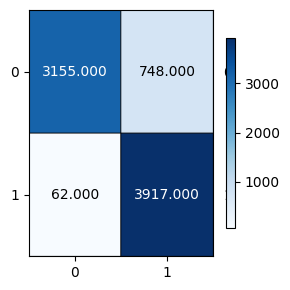

Homogeneity: 0.56801
Completeness: 0.58223
V-measure: 0.57503
Adjusted Rand Index: 0.63113
Adjusted Mutual Information Score: 0.57499


In [7]:
_ = run_evaluate_pipeline(X_subset_tfidf, 
                          y_subset, 
                          get_kmeans_predictions, 
                          n_clusters=2, 
                          fig_size=(3, 3))

### QUESTION 4: Report the plot of the percentage of variance that the top r principle components retain v.s. r, for r = 1 to 1000.

Ans: Please find figure below. <br> 

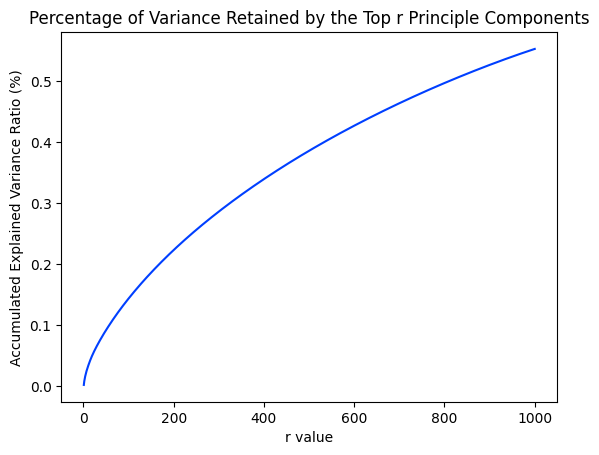

In [8]:
r_range = 1000

# Note that you don’t need to perform SVD multiple times: 
# performing SVD with r = 1000 gives you the data projected on all the top 1000 principle components
svd = TruncatedSVD(r_range)
X_subset_svd = svd.fit_transform(X_subset_tfidf)

plt.plot(list(range(1, r_range + 1)), svd.explained_variance_ratio_.cumsum())
plt.xlabel("r value")
plt.ylabel("Accumulated Explained Variance Ratio (%)")
plt.title("Percentage of Variance Retained by the Top r Principle Components")
plt.show()

### QUESTION 5: Let r be the dimension that we want to reduce the data to (i.e. n components). Try r = 1 −10, 20, 50, 100, 300, and plot the 5 measure scores v.s. r for both SVD and NMF. Report a good choice of r for SVD and NMF respectively. Note: In the choice of r, there is a trade-off between the information preservation, and better performance of k-means in lower dimensions.
***
> Ans: <br>
For SVD, we see that all the metrics have the best measure scores at r=300. However, noting that K-means relies on computung the Euclidean distances between data points, we need to consider the fact that the model may not perform well if the data is partitioned into too many components. This is because the higher dimension we partition the dataset into, the more similar all the Euclidean distances will become. From the plot above, we notice that at r=20, the measure scores no longer significantly increase beyond this point while the information is adequately preserved. Therefore, we would choose **r=20 for SVD**. <br>
For NMF, it is obvious that r=2 renders the best measure scores. The choice is also ideal for K-means, and we would choose **r=2 for NMF**. 

### QUESTION 6: How do you explain the non-monotonic behavior of the measures as r increases?
***
> Ans: <br>
Intuitively, we would assume that when r increases, the increased componets would help capture data features more accurately and lead to better measure scores. Nonetheless, the trend is observed in neither of the resulted plots. As mentioned in the previous answer, K-means measures the Euclidean distances between data points, and in high dimensional spaces the distance is no longer a good measure because all the individual points tend to be equidistant from each other. <br>
Considering the differences between SVD and NMF, we notice a spike in the NMF plot, while SVD renders a rather stable result after a certain r. The reason is that SVD results are more deterministic. NMF only gives U and V matrices, but SVD has an additional Sigma matrix which places the most relevent features in higher hierarchy, so the increase of r will not cause a sudden drop or rise in measure scores. 

### QUESTION 7: Are these measures on average better than those computed in Question 3?
***
> Ans: <br>

|   | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Adjusted Mutual Information Score |
| --- | --- | --- | --- | --- | --- |
| Q3 | .568 | .582 | .575 | .631 | .574 |
| Q7 (SVD with best r) | .576 | .590 | .583 | .638 | .583 |
| Q7 (NMF with best r) | .592 | .593 | .593 | .696 | .593 |

Comparing all five metrics, under the best r, the performances with SVD and NMF are comparable (within 0.1 difference) with the performance without  SVD and NMF  in Q3. However, without selecting the best r, the average performances with SVD and NMF are worse than without SVD and NMF.

In [9]:
def get_best_r_and_plot_scores(rs: List[int], 
                               transformer, 
                               params: Dict, 
                               X: np.ndarray, 
                               y: np.ndarray, 
                               pred_func: Callable, 
                               n_clusters: int,
                               plot_figure: bool=True):
    """
    Search best r by the given transformer and cluster method,
    and plot five clustering scores with respect to r.
    
    Parameters
    ----------
    rs: List[int], the searching scope.
    transformer: any dimension reducer.
    params: dict, parameters for transformer.
    X: np.ndarray, input vectors.
    y: np.ndarray, ground truth labels.
    pred_func: Callable, the clustering and predicting function.
    n_clusters: int, number of clusters.
    
    Return
    ------
    best_record: Dict, includes best_r (int, r with best score), best_score (float), best_vecs (transformed vectors with dimension=best_r) for each metric
    """
    scores = []
    best_record = defaultdict(lambda: defaultdict(int))
    vecs = defaultdict(lambda: defaultdict(None))
    score_names = [
        "homogeneity",
        "completeness",
        "v_measure",
        "adjusted_rand_index",
        "adjusted_mutual_information",
    ]

    for r in tqdm(rs):
        # get transformed vectors
        X_transformed = transformer(r, **params).fit_transform(X)

        # compute score
        score = _get_one_score(X_transformed, y, pred_func, n_clusters)
        score.pop("contingency_matrix")

        for score_name in score_names:
            if score[score_name] > best_record[score_name]["best_score"]:
                best_record[score_name]["best_r"], best_record[score_name]["best_score"] = r, score[score_name]
                best_record[score_name]["best_vecs"] = X_transformed

        # record vecs
        vecs[r] = X_transformed
        
        # append score
        score["r"] = r
        scores.append(score)

    if plot_figure:
        pd.DataFrame(scores).plot("r", score_names)
        plt.ylabel("Scores")
        plt.show()
    
    for score_name in best_record:
        print(f"{score_name=}, best_r={best_record[score_name]['best_r']}, with best_score={best_record[score_name]['best_score']}")
    return vecs, best_record


def _get_one_score(X, y, pred_func, n_clusters):
    y_pred = pred_func(X, n_clusters=n_clusters)
    return get_cluster_scores(y, y_pred)


SVD - r vs 5 scores


  0%|          | 0/14 [00:00<?, ?it/s]

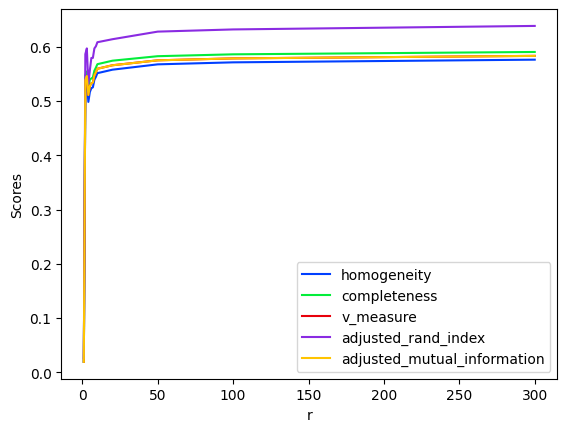

score_name='homogeneity', best_r=300, with best_score=0.57621
score_name='completeness', best_r=300, with best_score=0.59039
score_name='v_measure', best_r=300, with best_score=0.58321
score_name='adjusted_rand_index', best_r=300, with best_score=0.63841
score_name='adjusted_mutual_information', best_r=300, with best_score=0.58318


In [10]:
rs = list(range(1, 11)) + [20, 50, 100, 300]

print("SVD - r vs 5 scores")
svd_vecs, best_svd_record = get_best_r_and_plot_scores(
    rs=rs,
    transformer=TruncatedSVD,
    params={"random_state": SEED},
    X=X_subset_tfidf,
    y=y_subset,
    pred_func=get_kmeans_predictions,
    n_clusters=2,
)

NMF - r vs 5 scores


  0%|          | 0/14 [00:00<?, ?it/s]

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


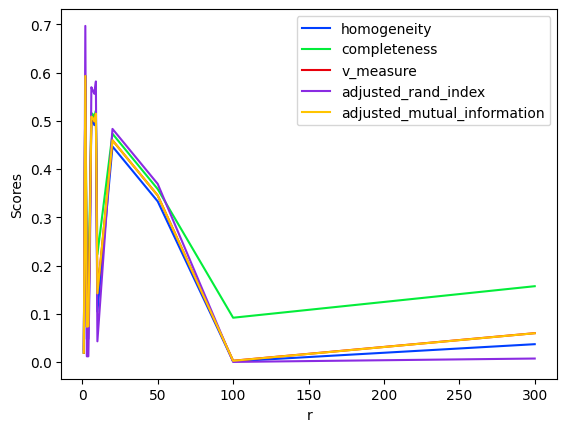

score_name='homogeneity', best_r=2, with best_score=0.59247
score_name='completeness', best_r=2, with best_score=0.59391
score_name='v_measure', best_r=2, with best_score=0.59319
score_name='adjusted_rand_index', best_r=2, with best_score=0.69688
score_name='adjusted_mutual_information', best_r=2, with best_score=0.59315


In [11]:
print("NMF - r vs 5 scores")
nmf_vecs, best_nmf_vecs_record = get_best_r_and_plot_scores(
    rs=rs,
    transformer=NMF,
    params={"random_state": SEED},
    X=X_subset_tfidf,
    y=y_subset,
    pred_func=get_kmeans_predictions,
    n_clusters=2,
)

### QUESTION 8: Visualize the clustering results for SVD and NMF.

We can visualize the clustering results by projecting the dimension-reduced data points
onto a 2-D plane by once again using SVD, and coloring the points according to these two respectively:  <br>
- Ground truth class label <br>
- Clustering label <br>

---
- SVD with your optimal choice of r for K-Means clustering;
- NMF with your choice of r for K-Means clustering.

To recap, you can accomplish this by first creating the dense representations and then once again projecting these
representations into a 2-D plane for visualization.

#### SVD

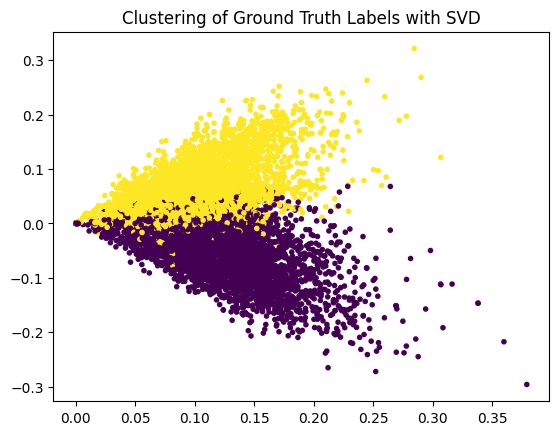

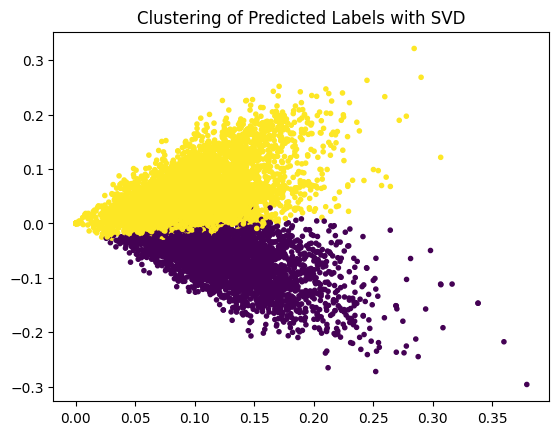

In [12]:
# choose r=20 for SVD
best_svd = TruncatedSVD(n_components=20, random_state=SEED).fit_transform(svd_vecs[20])

plt.figure()
plt.scatter(best_svd[:,0], best_svd[:,1], c=y_subset, marker='.')
plt.title("Clustering of Ground Truth Labels with SVD")
                                                                      
svd_labels = get_kmeans_predictions(best_svd, 2)                                                                          
plt.figure()
plt.scatter(best_svd[:,0], best_svd[:,1], c=svd_labels, marker='.')
plt.title("Clustering of Predicted Labels with SVD")
plt.show()

#### NMF

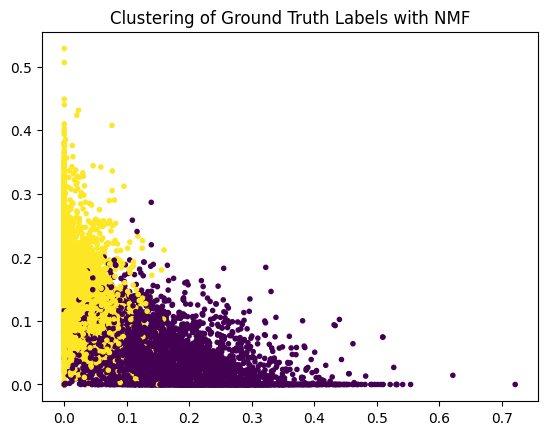

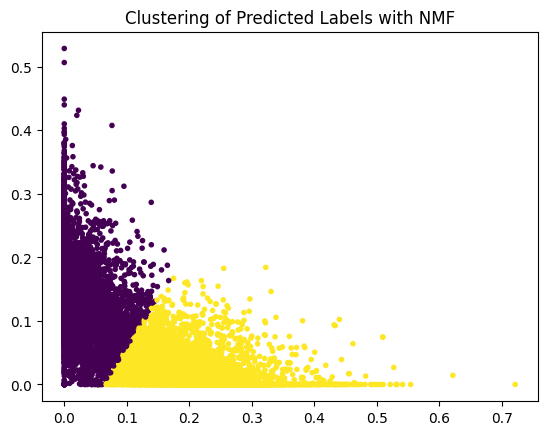

In [13]:
# choose r=2 for NMF
best_nmf = NMF(n_components=2, init="random", random_state=SEED).fit_transform(nmf_vecs[2])

plt.figure()
plt.scatter(best_nmf[:,0], best_nmf[:,1], c=y_subset, marker='.')
plt.title("Clustering of Ground Truth Labels with NMF")

nmf_labels = get_kmeans_predictions(best_nmf, 2)                                                                          
plt.figure()
plt.scatter(best_nmf[:,0], best_nmf[:,1], c=nmf_labels, marker='.')
plt.title("Clustering of Predicted Labels with NMF")
plt.show()

### QUESTION 9: What do you observe in the visualization? How are the data points of the two classes distributed? Is distribution of the data ideal for K-Means clustering?
***
> Ans: <br>
> 1. K-Means assumes that the clusters are isotropically shaped, so when the clusters are not round-shaped, K-Means may fail to identify the clusters properly. This can be observed in both SVD and NMF. The predicted clusters are unevenly sized.
> 2. K-Means may also fails when the clusters have unequal variances. This is observed in both SVD and NMF as well. For example, from SVD we see that the purple gound truth label is more sparsely distributed; from NMF the yellow gound truth label is more sparsely distributed. This also contributes to the mismatch between the ground truth and predicted labels.
> 3. We can also observe that K-Means fails to correctly label the data points around the border. For both SVD and NMF, the different ground truth labels are moderately overlapping, and K-Means might not correctly decide which cluster a data point belongs to under these circumstances.

> Summing up, the data possess several features including uneven sizes between clusters, unequal cluster variances, and does not have a distinct boundary between clusters. These happen to be some important features that K-Means rely on, and might not be ideal for K-Means clustering.

> Reference: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_assumptions.html#sphx-glr-auto-examples-cluster-plot-kmeans-assumptions-py

## Use all categories
***

### QUESTION 10: Load documents with the same configuration as in Question 1, but for ALL 20 categories. Construct the TF-IDF matrix, reduce its dimensionality using BOTH NMF and SVD (specify settings you choose and why), and perform K-Means clustering with k=20. Visualize the contingency matrix and report the five clustering metrics (DO BOTH NMF AND SVD).
***
> Ans: <br>
First, we search the best r for both SVD and NMF with the 5 measure scores. <br>
From the results, based on this discussion (https://piazza.com/class/lcjwqyyip6bid/post/120), we use V-measure as the representative metric since it is the harmonic mean of homogeneity and completeness measure, and should provide more balanced measurement. We know that the best V-measure are rendered when r=16 for SVD and r=8 for NMF. Therefore, we choose the two values in our settings.

> The 5 clustering metrics: <br>
>>**SVD** <br>
Homogeneity: 0.34861 <br>
Completeness: 0.38247 <br>
V-measure: 0.36476 <br>
Adjusted Rand Index: 0.13202 <br>
Adjusted Mutual Information Score: 0.3626 <br>

>>**NMF** <br>
Homogeneity: 0.318 <br>
Completeness: 0.36587 <br>
V-measure: 0.34026 <br>
Adjusted Rand Index: 0.11493 <br>
Adjusted Mutual Information Score: 0.33796 <br>

>Visualization of the contingency matrices are shown below.

In [55]:
# load data
newsgroups_all = fetch_20newsgroups(subset="all", remove=("headers", "footers"))

X_all = newsgroups_all["data"]
y_all = newsgroups_all["target"]

assert len(set(y_all)) == 20

len(X_all), len(y_all)

(18846, 18846)

In [56]:
# generate tfidf vectors
X_all_tfidf = tfidf.fit_transform(X_all)
X_all_tfidf.shape

(18846, 45365)

SVD - r vs 5 scores


  0%|          | 0/14 [00:00<?, ?it/s]

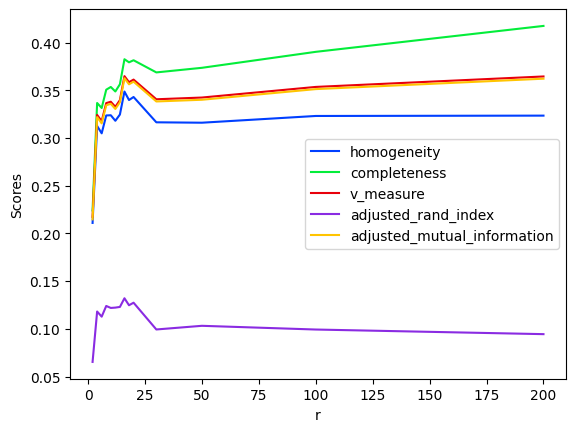

score_name='homogeneity', best_r=16, with best_score=0.34861
score_name='completeness', best_r=200, with best_score=0.41738
score_name='v_measure', best_r=16, with best_score=0.36476
score_name='adjusted_rand_index', best_r=16, with best_score=0.13202
score_name='adjusted_mutual_information', best_r=16, with best_score=0.3626

NMF - r vs 5 scores


  0%|          | 0/14 [00:00<?, ?it/s]

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


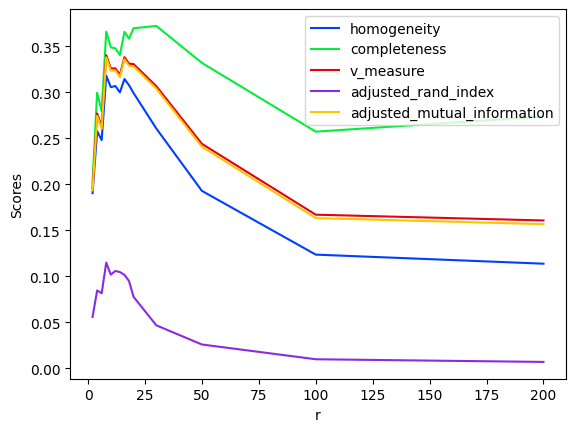

score_name='homogeneity', best_r=8, with best_score=0.318
score_name='completeness', best_r=30, with best_score=0.37204
score_name='v_measure', best_r=8, with best_score=0.34026
score_name='adjusted_rand_index', best_r=8, with best_score=0.11493
score_name='adjusted_mutual_information', best_r=8, with best_score=0.33796


In [57]:
# search best r for SVD and NMF
# Question 17 will use at most 200 components
rs = list(range(2, 21, 2)) + [30, 50, 100, 200]

print("SVD - r vs 5 scores")
svd_vecs_all, best_svd_record_all = get_best_r_and_plot_scores(
    rs=rs,
    transformer=TruncatedSVD,
    params={"random_state": SEED},
    X=X_all_tfidf,
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
)

print()
print("==========================================")
print("NMF - r vs 5 scores")
nmf_vecs_all, best_nmf_record_all = get_best_r_and_plot_scores(
    rs=rs,
    transformer=NMF,
    params={"random_state": SEED},
    X=X_all_tfidf,
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
)

SVD scores


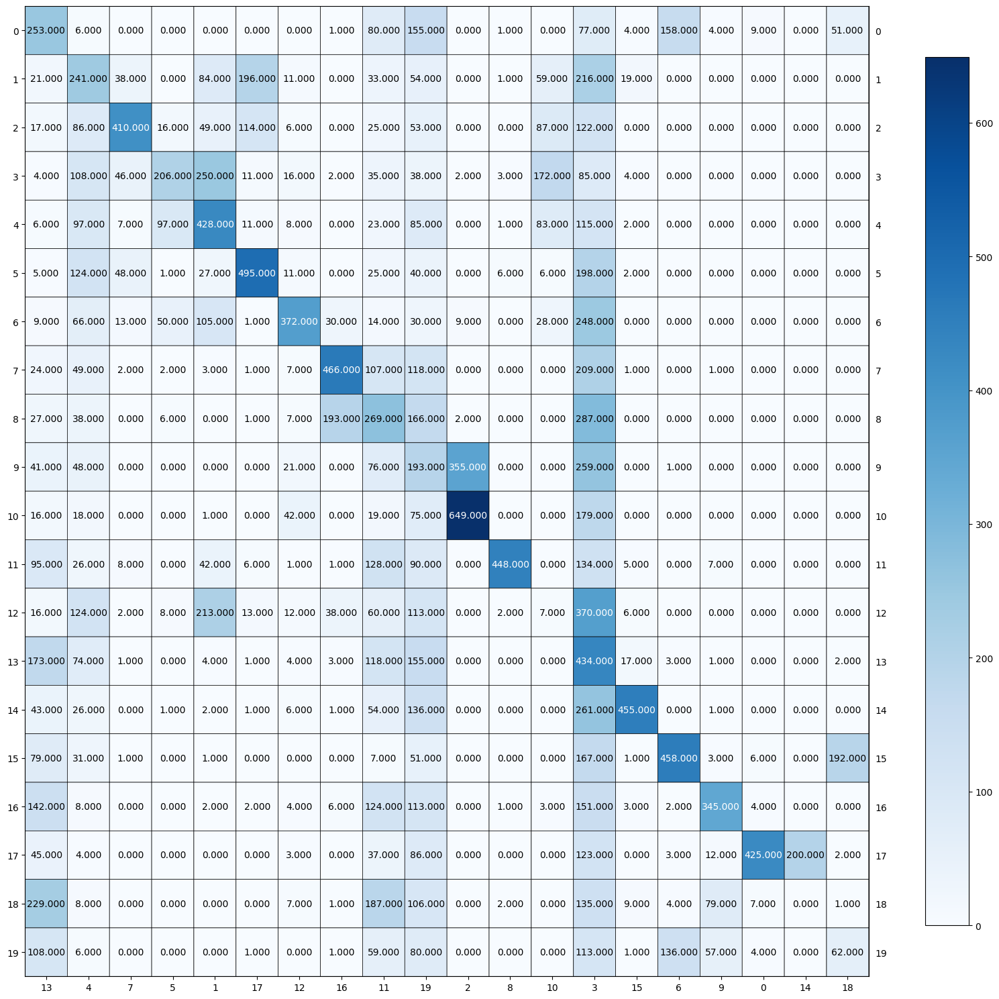

Homogeneity: 0.34861
Completeness: 0.38247
V-measure: 0.36476
Adjusted Rand Index: 0.13202
Adjusted Mutual Information Score: 0.3626

NMF scores


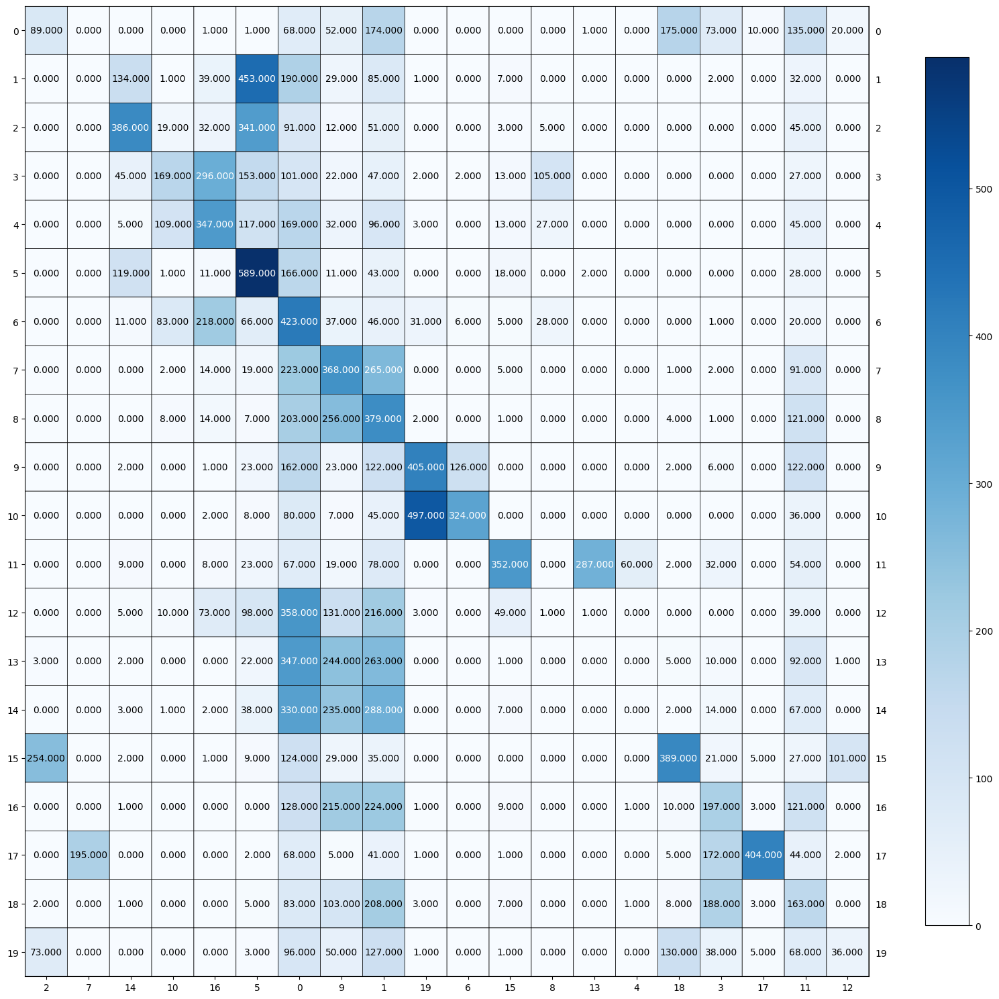

Homogeneity: 0.318
Completeness: 0.36587
V-measure: 0.34026
Adjusted Rand Index: 0.11493
Adjusted Mutual Information Score: 0.33796


In [58]:
# report scores for SVD and NMF with best r
# r=16 for SVD and r=8 for NMF
print("SVD scores")
_ = run_evaluate_pipeline(
    X=svd_vecs_all[16],
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
    fig_size=(15, 15),
)

print()
print("==========================================")
print("NMF scores")
_ = run_evaluate_pipeline(
    X=nmf_vecs_all[8],
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
    fig_size=(15, 15),
)

### QUESTION 11: Reduce the dimension of your dataset with UMAP. Consider the following settings: `n_components` = [5, 20, 200], `metric` = ”cosine” vs. ”euclidean”. If ”cosine” metric fails, please look at the FAQ at the end of this spec. Report the permuted contingency matrix and the five clustering evaluation metrics for the different combinations (6 combinations).
***
> Ans:<br>


| n_components | metric | Homogeneity | Completeness | V-measure | Adjusted Rand Index | Adjusted Mutual Information Score |
| --- | --- | --- | --- | --- | --- | --- |
| 5 | euclidean | .015 | .016 | .016 | .001 | .012 |
| 5 | cosine | .285 | .291 | .288 | .171 | .285 |
| 20 | euclidean | .006 | .006 | .006 | .000 | .003 |
| 20 | cosine | .571 | .587 | .579 | .446 | .578 |
| 200 | euclidean | .005 | .005 | .005 | .000 | .001 |
| 200 | cosine | .563 | .564 | .564 | .414 | .562 |


>Visualization of the contingency matrices are shown above.

  0%|          | 0/3 [00:00<?, ?it/s]

report n_components=5, metric='euclidean'


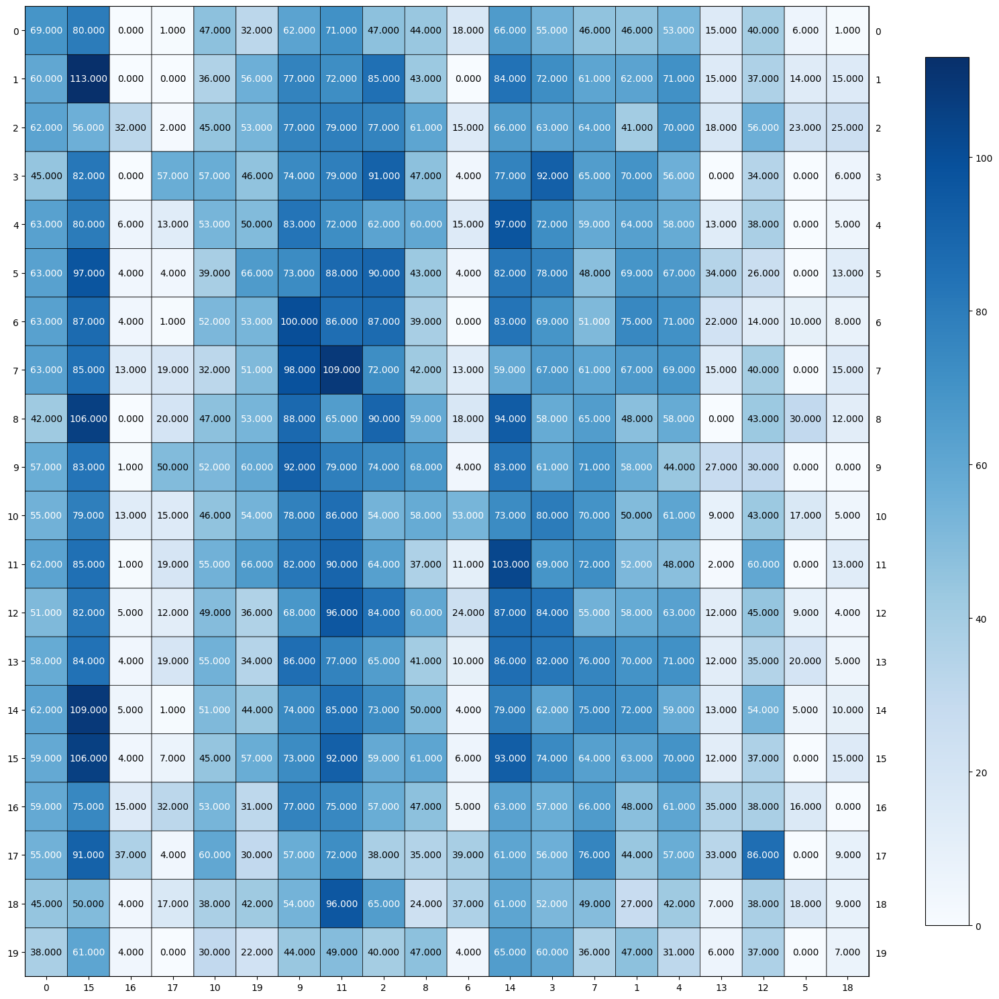

Homogeneity: 0.01568
Completeness: 0.01666
V-measure: 0.01616
Adjusted Rand Index: 0.00153
Adjusted Mutual Information Score: 0.01287

report n_components=5, metric='cosine'


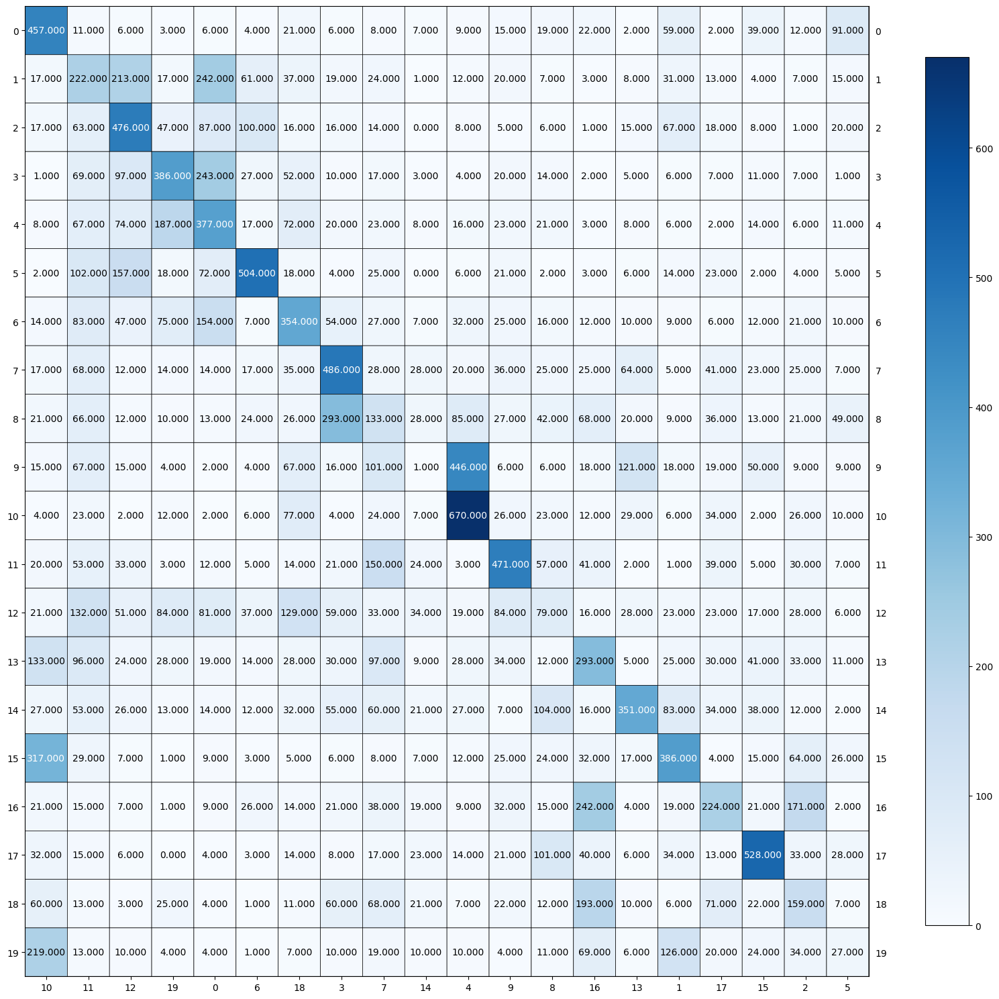

Homogeneity: 0.28512
Completeness: 0.29102
V-measure: 0.28804
Adjusted Rand Index: 0.17167
Adjusted Mutual Information Score: 0.28572

report n_components=20, metric='euclidean'


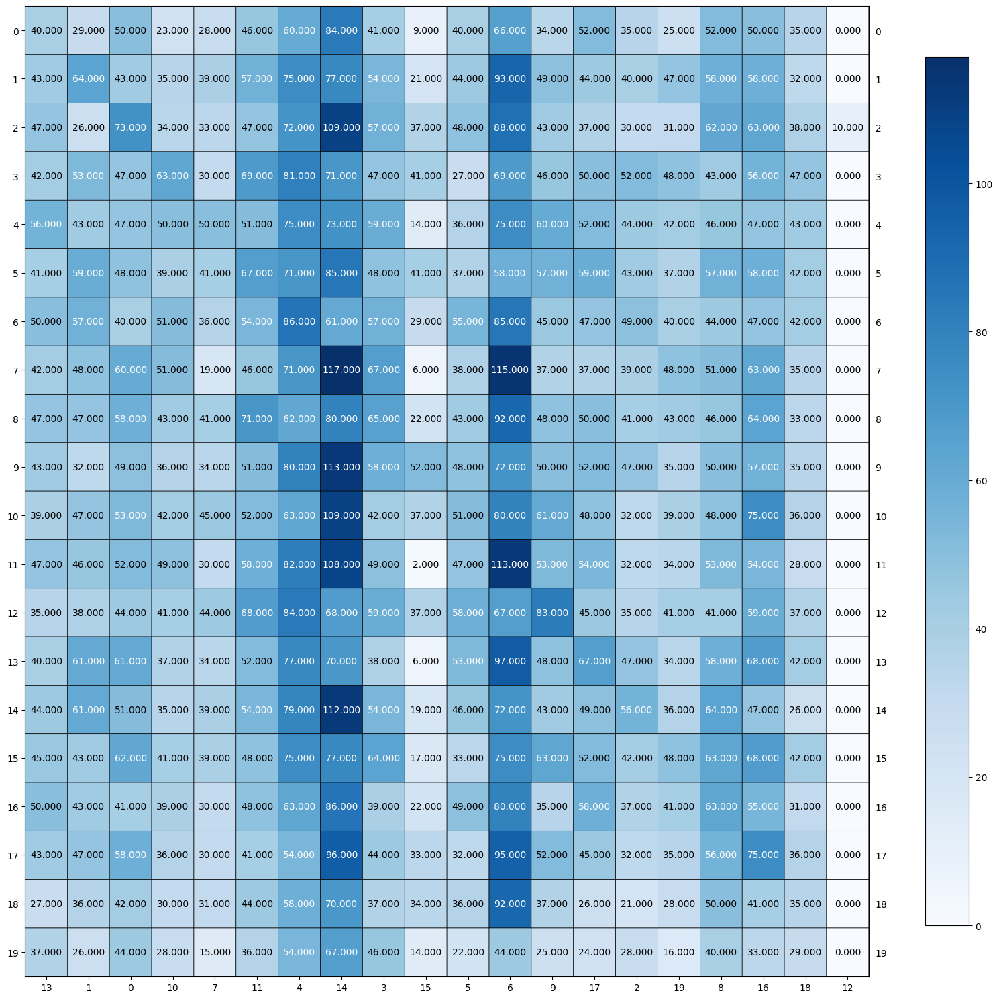

Homogeneity: 0.00665
Completeness: 0.00685
V-measure: 0.00675
Adjusted Rand Index: 0.00085
Adjusted Mutual Information Score: 0.0035

report n_components=20, metric='cosine'


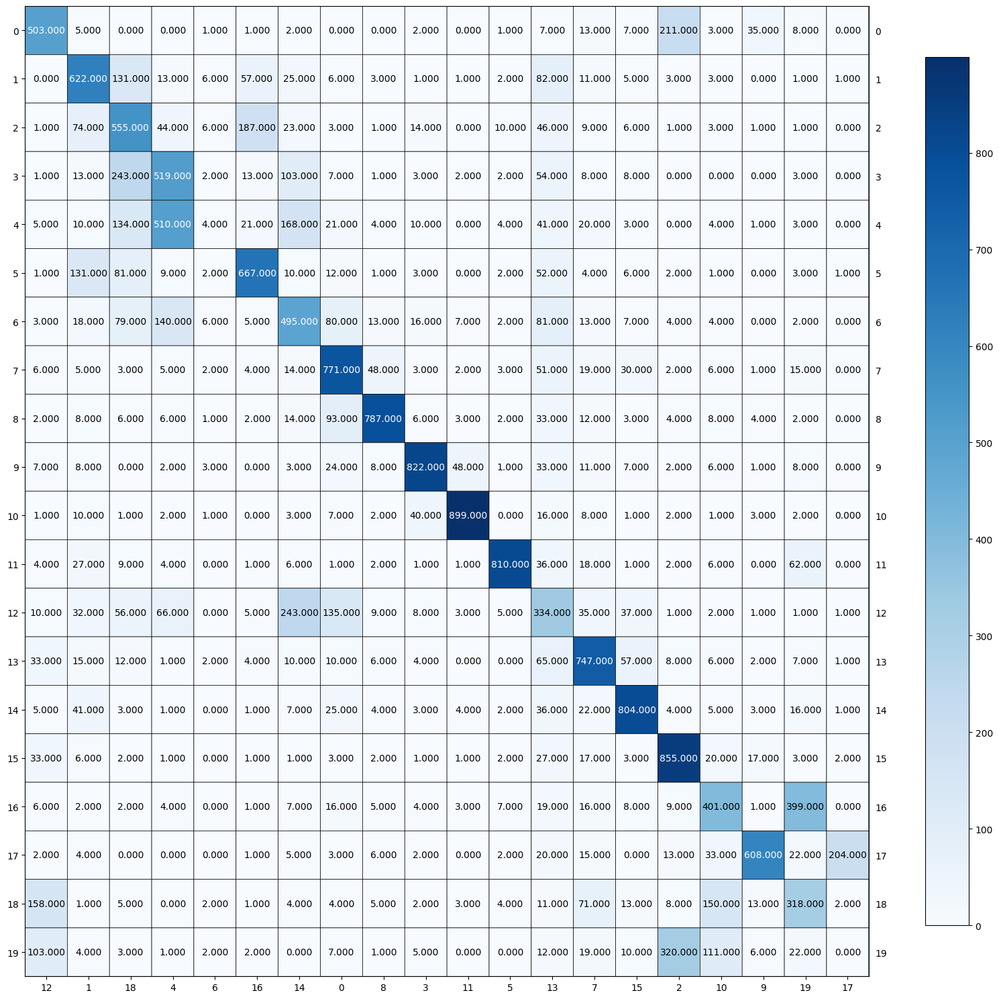

Homogeneity: 0.57176
Completeness: 0.58725
V-measure: 0.5794
Adjusted Rand Index: 0.44692
Adjusted Mutual Information Score: 0.57802

report n_components=200, metric='euclidean'


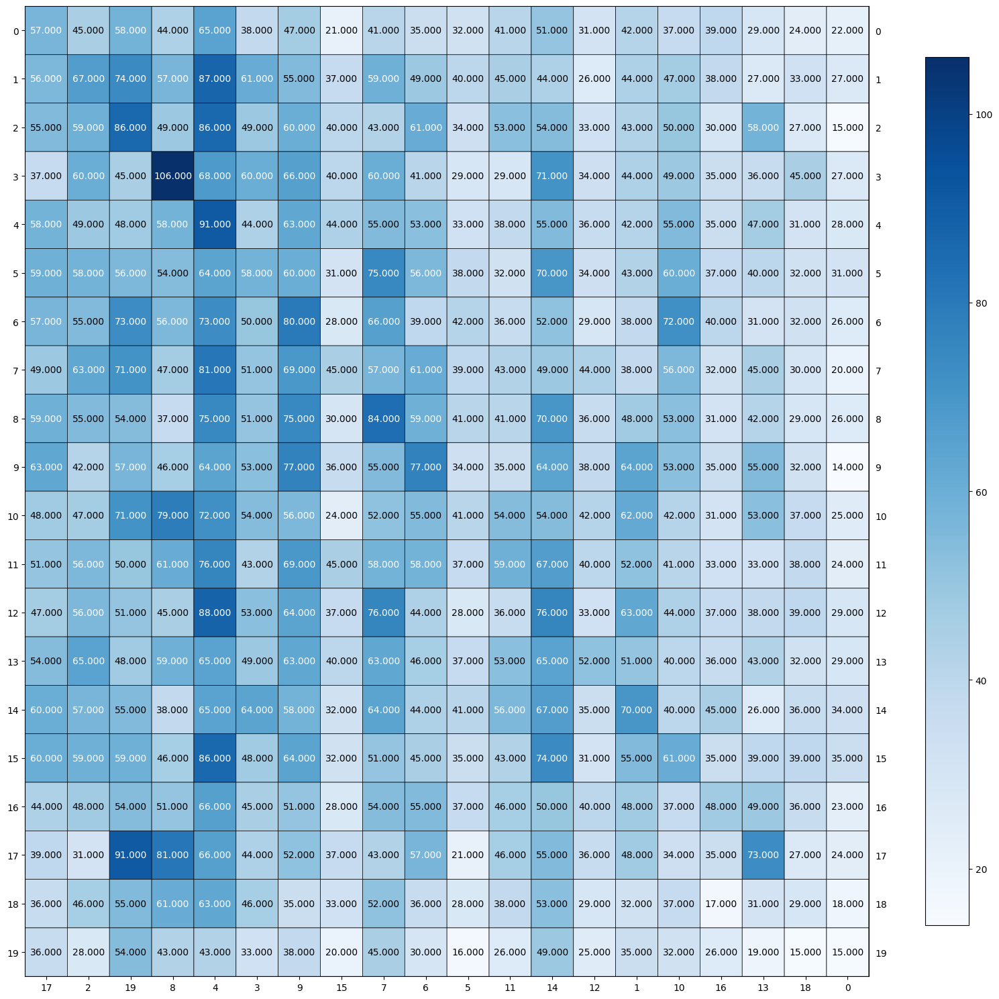

Homogeneity: 0.00518
Completeness: 0.00523
V-measure: 0.00521
Adjusted Rand Index: 0.0007
Adjusted Mutual Information Score: 0.00198

report n_components=200, metric='cosine'


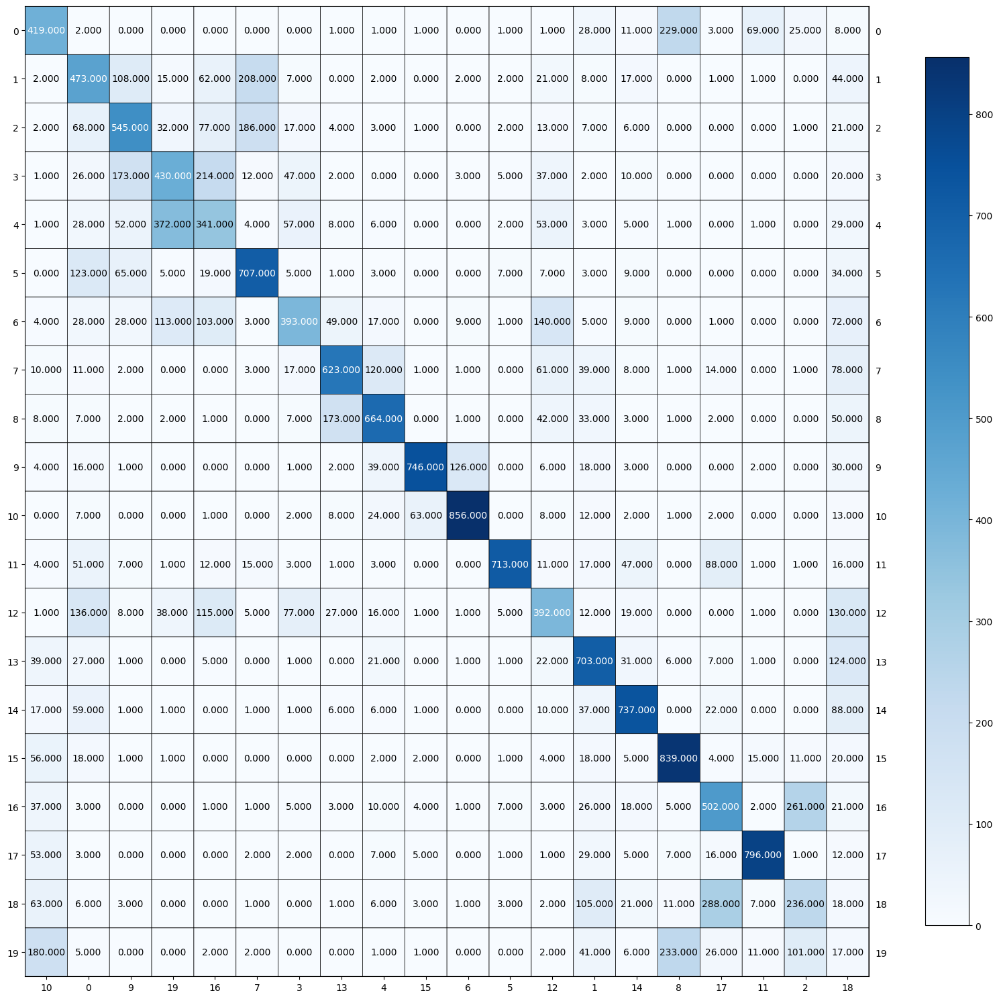

Homogeneity: 0.56312
Completeness: 0.56494
V-measure: 0.56403
Adjusted Rand Index: 0.41426
Adjusted Mutual Information Score: 0.56262



In [59]:
# Non-deterministic results with random_state: https://github.com/lmcinnes/umap/issues/183
def get_umap_embeddings(X, n_components, metric):
    return umap.UMAP(n_components, metric=metric, random_state=np.random.RandomState(SEED)).fit_transform(X)


for n_components in tqdm([5, 20, 200]):
    for metric in ["euclidean", "cosine"]:
        print(f"report {n_components=}, {metric=}")
        X_all_umap = get_umap_embeddings(X_all_tfidf, n_components, metric)
        _ = run_evaluate_pipeline(
            X=X_all_umap,
            y=y_all,
            pred_func=get_kmeans_predictions,
            n_clusters=20,
            fig_size=(15, 15),
        )
        print()

### QUESTION 12: Analyze the contingency matrices. Which setting works best and why? What about for each metric choice?
***
> Ans: <br>
By observing the contingency matrices, we see that the setting {n_components=20, metric='cosine'} works best in all five metrics, and has the most correct predictions along the diagonal cells. This is due to our choice of adopting the cosine distance to evaluate the similarity between vectors. Cosine similarity measures the angle between two vectors. In other words, the measurement is not affected by the length or magtitude of an individual vector, eliminating the consequent noise. Accordingly, even if we increased n_components from 5 to 20, cosine similarity does not lose its effectiveness and still exhibits desirable performance, even surpassing previous results. However, it slightly decreases when we increased n_components from 20 to 200. We can observe all the same trend in each clustering measurement metrics: Homogeneity, Completeness, V-measure, Adjusted Rand Index, and Adjusted mutual Information Score. <br>

>Comparing the distance metrics 'Euclidean' and 'Cosine', we can conclulde that cosine distance generally performs better than euclidean distance. As we adjust the number of components, the measures increase over time for cosine distances while the results for euclidean distances stay almost the same. Elaborating on the fact that cosine similarity is irrespective of distance, we can recall Euclidean distance measurement is closely related to the given number of components. When the data points become equidistant, the data might instead be poorly clustered. 

evaluate TF-IDF


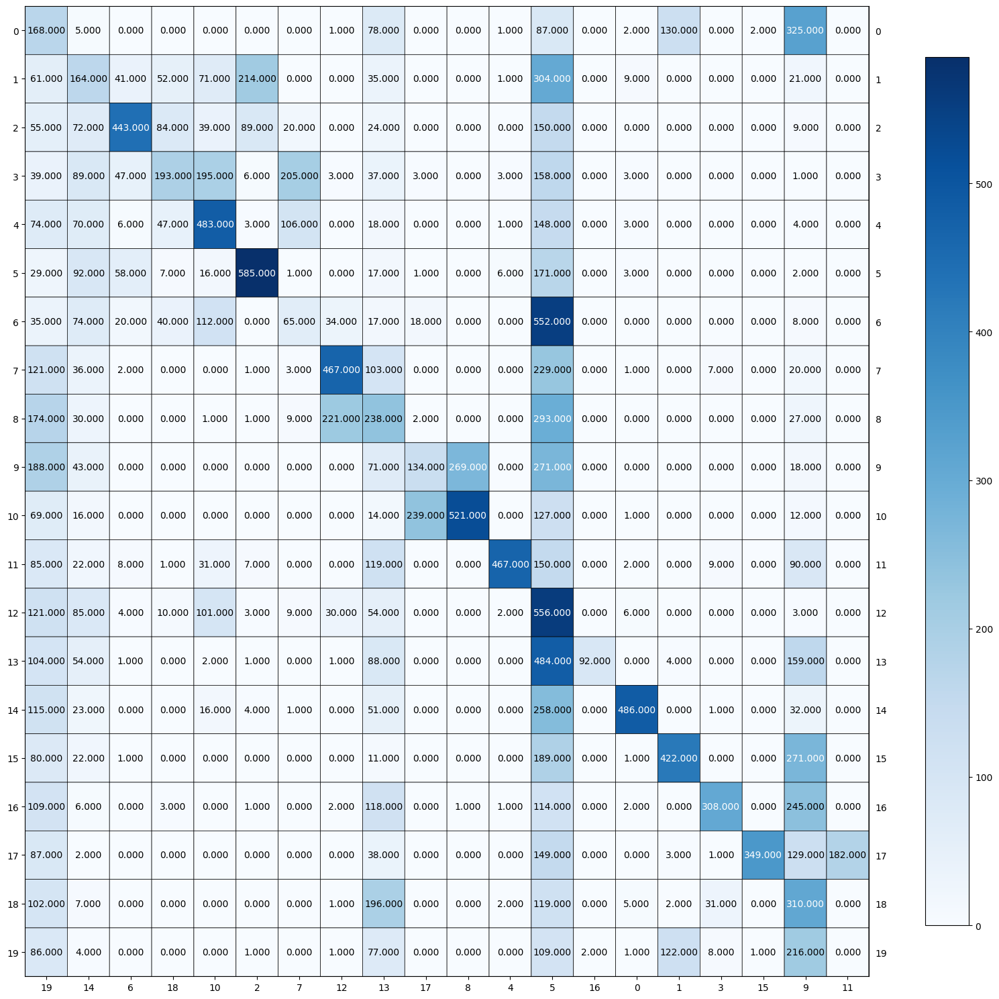

Homogeneity: 0.34827
Completeness: 0.397
V-measure: 0.37104
Adjusted Rand Index: 0.1221
Adjusted Mutual Information Score: 0.36887
sum of 5 scores: 1.60728


In [19]:
print("evaluate TF-IDF")
scores_tfidf = run_evaluate_pipeline(
    X=X_all_tfidf,
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
    fig_size=(15, 15),
)
scores_tfidf.pop("contingency_matrix")
print("sum of 5 scores:", round(sum(scores_tfidf.values()), 5))

UMAP - r vs 5 scores


  0%|          | 0/14 [00:00<?, ?it/s]

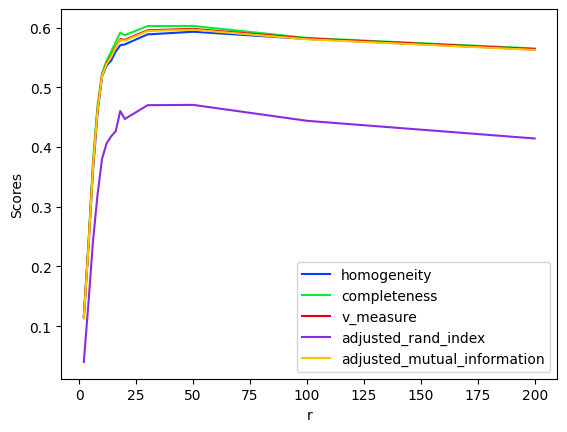

score_name='homogeneity', best_r=50, with best_score=0.59297
score_name='completeness', best_r=50, with best_score=0.60274
score_name='v_measure', best_r=50, with best_score=0.59782
score_name='adjusted_rand_index', best_r=50, with best_score=0.47052
score_name='adjusted_mutual_information', best_r=50, with best_score=0.5965


In [20]:
print("UMAP - r vs 5 scores")
ump_vecs_all, best_umap_record_all = get_best_r_and_plot_scores(
    rs=rs,
    transformer=umap.UMAP,
    params={
        "metric": "cosine",  # cosine got better score in previous search
        "random_state": SEED,
    },
    X=X_all_tfidf,
    y=y_all,
    pred_func=get_kmeans_predictions,
    n_clusters=20,
)

### QUESTION 13: So far, we have attempted K-Means clustering with 4 different representation learning techniques (sparse TF-IDF representation, PCA-reduced, NMF-reduced, UMAP-reduced). Compare and contrast the clustering results across the 4 choices, and suggest an approach that is best for the K-Means clustering task on the 20-class text data. Choose any choice of clustering metrics for your comparison.
***
> Ans: <br>
Based on this discussion (https://piazza.com/class/lcjwqyyip6bid/post/120), we use V-measure as the representative metric since it is the harmonic mean of homogeneity and completeness measure, and should provide more balanced measurement. Of all the methods we have tested above, take a look at the best V-measure scores respectively. We notice that for TF-IDF, SVD and NMF, the scores fall around 0.3 (i.e. TF-IDF: 0.37104; SVD: 0.36442; NMF: 0.331). However, for UMAP-metric set to cosine, we observe that the V-measure increases as we increase the number of components. At n_components=20, the score reached 0.5794. If we have to choose an approach for K-Means clustering for the 20-class text data, it is ideal to adopt UMAP-metric set to cosine since the data has high dimension, and measuring the closeness of data points with cosine distance will be more effective than measuring with Euclidean distance.

### QUESTION 14: Use UMAP to reduce the dimensionality properly, and perform Agglomerative clustering with `n_clusters`=20 . Compare the performance of “ward” and “single” linkage criteria. Report the five clustering evaluation metrics for each case.
***
> Ans: <br>
> * Evaluation metrics:

>> **ward** <br>
Homogeneity: 0.57226 <br>
Completeness: 0.5875 <br>
V-measure: 0.57978 <br>
Adjusted Rand Index: 0.43746 <br>
Adjusted Mutual Information Score: 0.5784 <br>

>> **single** <br>
Homogeneity: 0.0043 <br>
Completeness: 0.23171 <br>
V-measure: 0.00844 <br>
Adjusted Rand Index: -1e-05 <br>
Adjusted Mutual Information Score: 0.00448 <br>

> The results showed that ward linkage performs significantly better than single linkage. Ward linkage minimizes the sum of squared differences within all clusters, while single linkage minimizes the distance between the closest observations of pairs of clusters. Since agglomerative cluster performs hierarchical clustering using a bottom up approach, it follows the “rich get richer” behavior, and may lead to uneven cluster sizes. Therefore, ward linkage can render results with the most regular sizes while single linkage is prone to giving incorrect results, especially when outliers or noise exist. 
However, single linkage is computationally efficient and can be useful for hierarchical clustering of larger datasets. 

> Reference: https://scikit-learn.org/stable/modules/clustering.html#different-linkage-type-ward-complete-average-and-single-linkage

linkage=ward


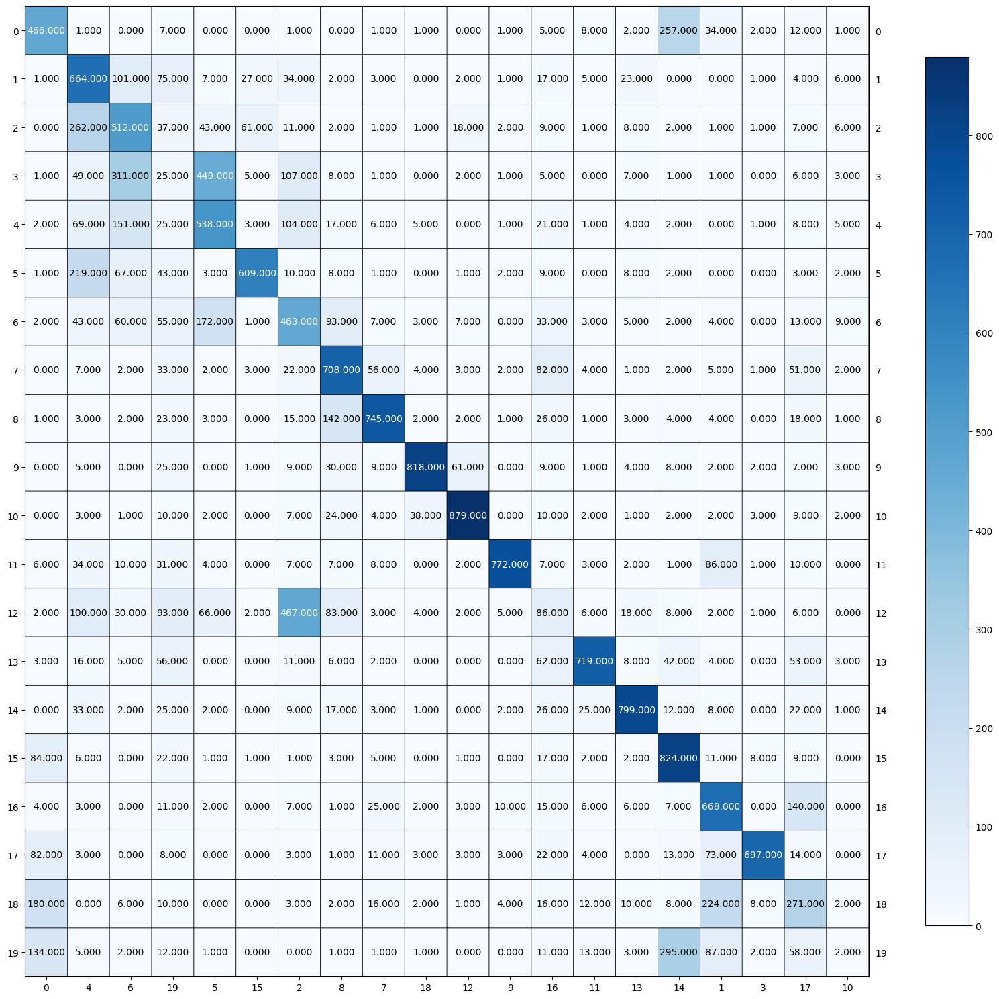

Homogeneity: 0.57226
Completeness: 0.5875
V-measure: 0.57978
Adjusted Rand Index: 0.43746
Adjusted Mutual Information Score: 0.5784

linkage=single


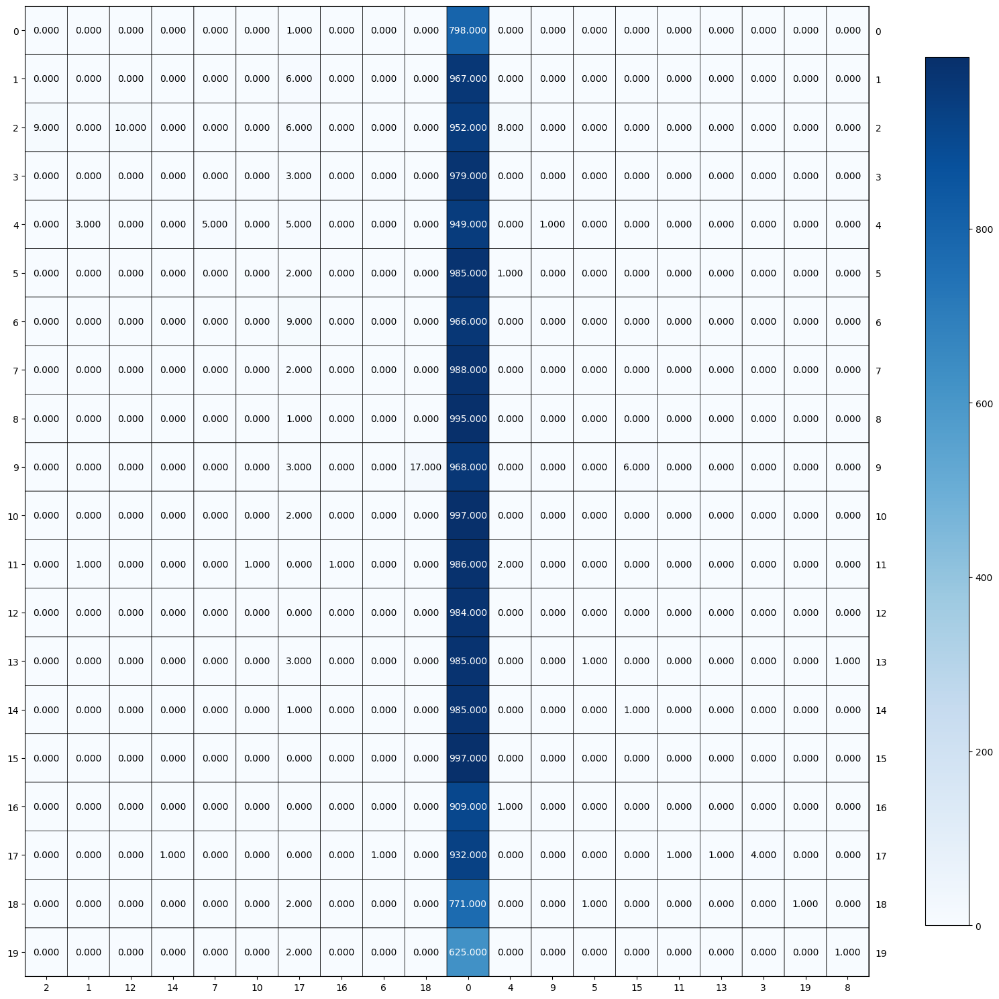

Homogeneity: 0.0043
Completeness: 0.23171
V-measure: 0.00844
Adjusted Rand Index: -1e-05
Adjusted Mutual Information Score: 0.00448


In [21]:
def get_agglomerative_ward_predictions(X, n_clusters):
    return AgglomerativeClustering(
        n_clusters=n_clusters, linkage="ward"
    ).fit_predict(X)


def get_agglomerative_single_predictions(X, n_clusters):
    return AgglomerativeClustering(
        n_clusters=n_clusters, linkage="single"
    ).fit_predict(X)


# best_umap_vecs_all is when r = 50
print("linkage=ward")
_ = run_evaluate_pipeline(
    X=ump_vecs_all[50],
    y=y_all,
    pred_func=get_agglomerative_ward_predictions,
    n_clusters=20,
    fig_size=(15, 15),
)

print()
print("==========================================")

print("linkage=single")
_ = run_evaluate_pipeline(
    X=ump_vecs_all[50],
    y=y_all,
    pred_func=get_agglomerative_single_predictions,
    n_clusters=20,
    fig_size=(15, 15),
)

### QUESTION 15: Apply HDBSCAN on UMAP-transformed 20-category data. Vary the min cluster size among 20, 100, 200 and report your findings in terms of the five clustering evaluation metrics - you will plot the best contingency matrix in the next question. Feel free to try modifying other parameters in HDBSCAN to get better performance.
***
> Ans:
> * **min_cluster_size=20**
>> Homogeneity: 0.00042 <br>
Completeness: 0.0712 <br>
V-measure: 0.00084 <br>
Adjusted Rand Index: -0.0 <br>
Adjusted Mutual Information Score: 0.00046 <br>


> * **min_cluster_size=100**
>> Homogeneity: 0.44792 <br>
Completeness: 0.5868 <br>
V-measure: 0.50804 <br>
Adjusted Rand Index: 0.18081 <br>
Adjusted Mutual Information Score: 0.50661 <br>

> * **min_cluster_size=200**
>> Homogeneity: 0.40849 <br>
Completeness: 0.61976 <br>
V-measure: 0.49242 <br>
Adjusted Rand Index: 0.19922 <br>
Adjusted Mutual Information Score: 0.49149 <br>

>We notice that min_cluster_size=100 and min_cluster_size=200 have similar performances, and both being better than min_cluster_size=20. We would expect better clustering when min_cluster_size is tuned higher, but the trend is not observed. This is because HDBSCAN has a second parameter min_samples, whose default value is the same as whatever min_cluster_size is set to. By tunung min_samples, we can recover some of the original clusters and avoid too much data being evaluated as noisy data points.

n_clusters=20


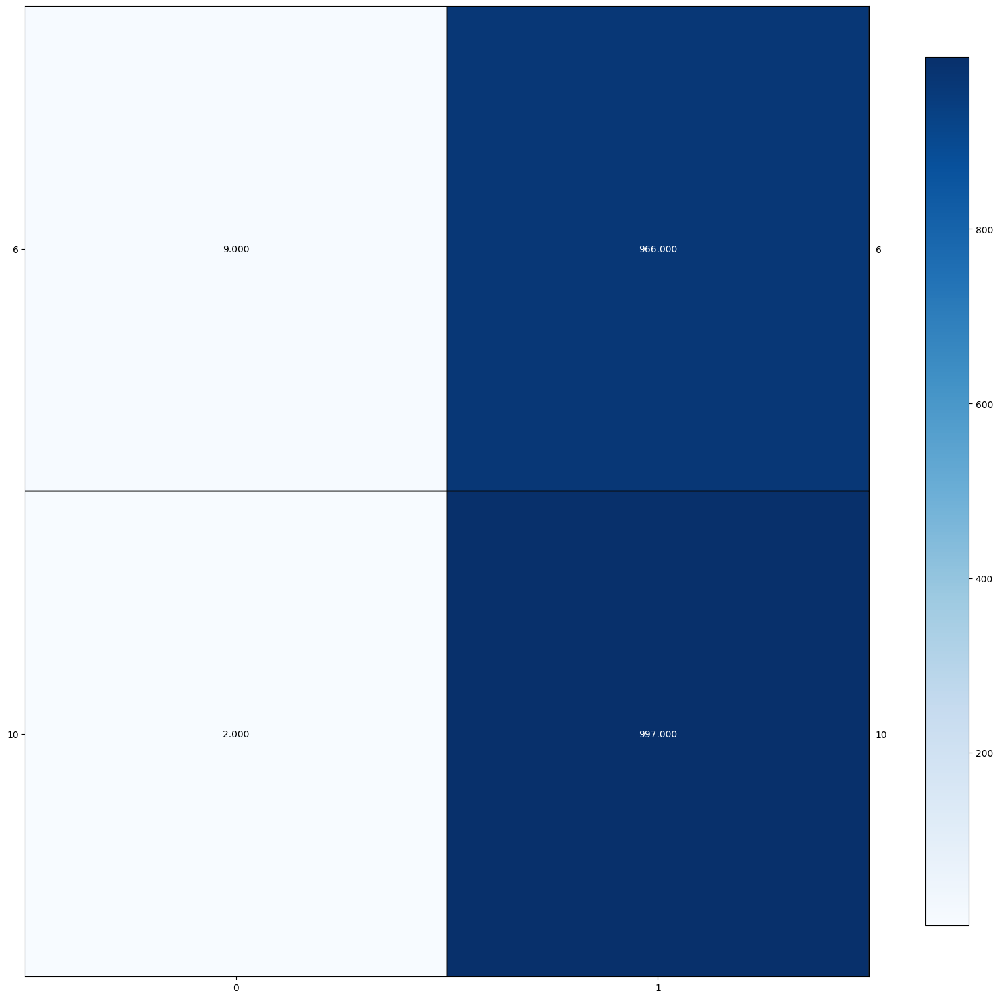

Homogeneity: 0.00042
Completeness: 0.0712
V-measure: 0.00084
Adjusted Rand Index: -0.0
Adjusted Mutual Information Score: 0.00046

n_clusters=100


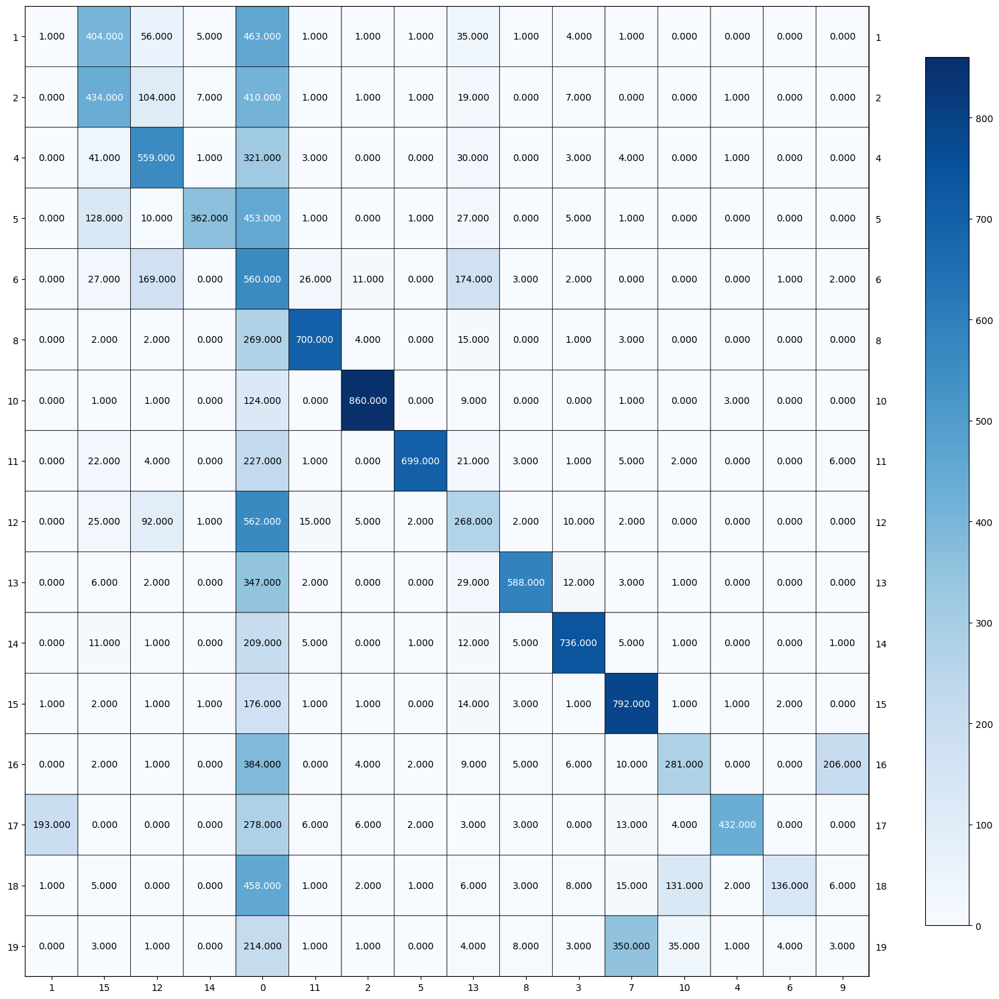

Homogeneity: 0.44792
Completeness: 0.5868
V-measure: 0.50804
Adjusted Rand Index: 0.18081
Adjusted Mutual Information Score: 0.50661

n_clusters=200


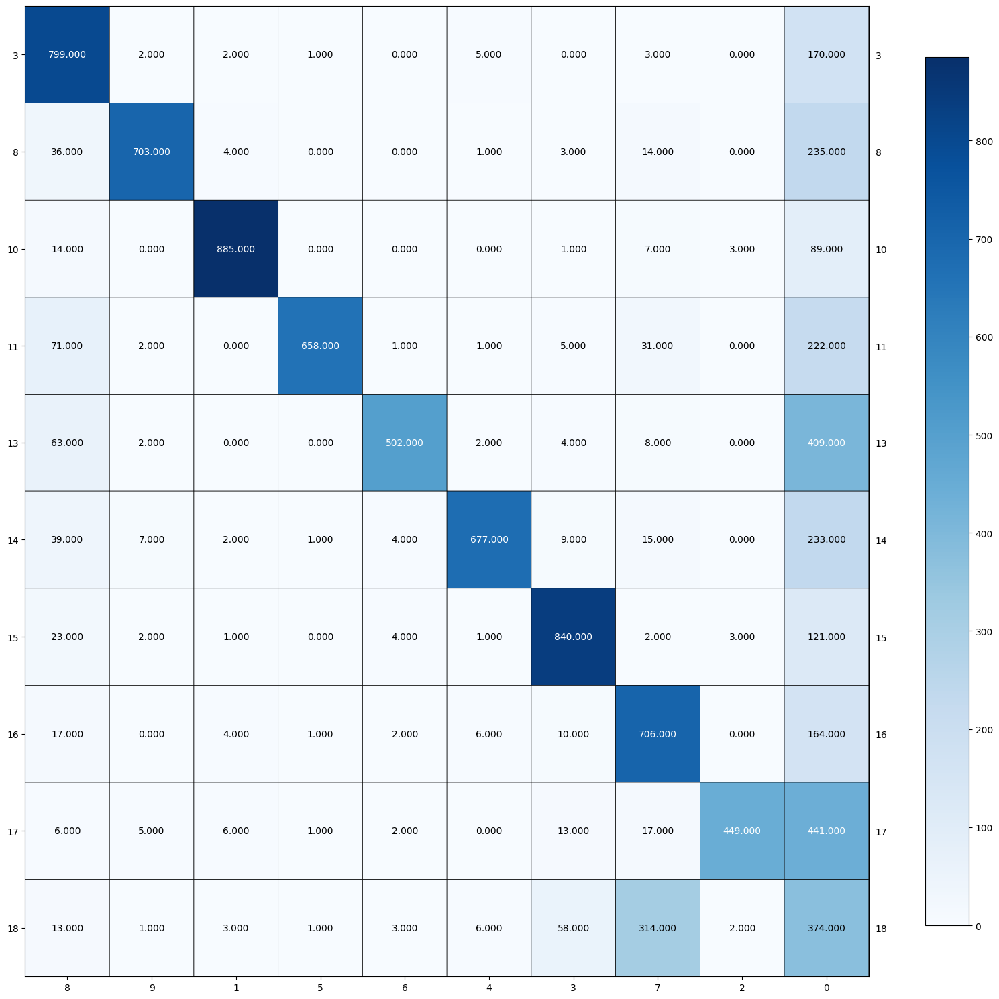

Homogeneity: 0.40849
Completeness: 0.61976
V-measure: 0.49242
Adjusted Rand Index: 0.19922
Adjusted Mutual Information Score: 0.49149

score_name='homogeneity', best_n_clusters=100, with best_score=0.44792
score_name='completeness', best_n_clusters=200, with best_score=0.61976
score_name='v_measure', best_n_clusters=100, with best_score=0.50804
score_name='adjusted_rand_index', best_n_clusters=200, with best_score=0.19922
score_name='adjusted_mutual_information', best_n_clusters=100, with best_score=0.50661


In [22]:
def get_hdbscan_predictions(X, n_clusters):
    return HDBSCAN(min_cluster_size=n_clusters).fit_predict(X)

score_names = [
    "homogeneity",
    "completeness",
    "v_measure",
    "adjusted_rand_index",
    "adjusted_mutual_information",
]

best_record = defaultdict(lambda: defaultdict(int))
con_mats = defaultdict(None)

for n_clusters in [20, 100, 200]:
    print(f"{n_clusters=}")
    scores = run_evaluate_pipeline(
        X=ump_vecs_all[50],
        y=y_all,
        pred_func=get_hdbscan_predictions,
        n_clusters=n_clusters,
        fig_size=(15, 15),
    )
    con_mat = scores.pop("contingency_matrix")
    
    for score_name in score_names:
        if scores[score_name] > best_record[score_name]["best_score"]:
            best_record[score_name]["best_n_clusters"], best_record[score_name]["best_score"] = n_clusters, scores[score_name]
            best_record[score_name]["best_con_mat"] = con_mat
            
    con_mats[n_clusters] = con_mat

    print()
    
for score_name in best_record:
    print(f"{score_name=}, best_n_clusters={best_record[score_name]['best_n_clusters']}, with best_score={best_record[score_name]['best_score']}")
    

### QUESTION 16: Contingency matrix Plot the contingency matrix for the best clustering model from Question 15. How many clusters are given by the model? What does “-1” mean for the clustering labels? Interpret the contingency matrix considering the answer to these questions.
***
> Ans: <br>
>* 16 clusters are given by the model from the contingency matrix suggested. <br>
>* -1 means noise or outliers that are not classified into any of the clusters. <br>
>* There is no "-1" clustering label in our result, meaning that all data are classified into a certain cluster. <br>
In our setting, min_cluster_size = min_samples = 100. min_samples is deterministic of how conservative a prediction will be. The larger the value, the more conservative the clustering, and more points will be declared as noise. The choice of parameter is desirable in terms that it preserves enough of the original clusters without pruning out too much information.

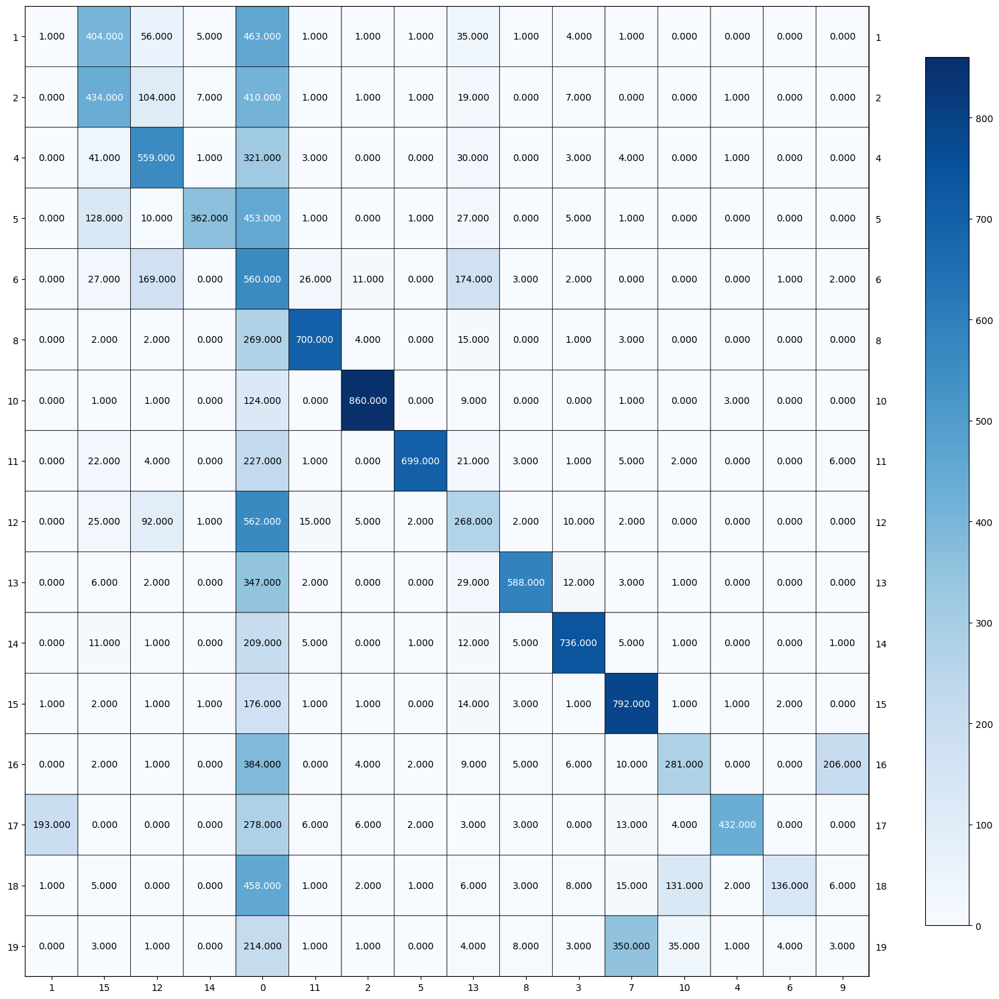

In [23]:
# the best_con_mat happened when n_clusters=100
best_con_mat = con_mats[100]

rows, cols = linear_sum_assignment(best_con_mat, maximize=True)
plot_mat(
    best_con_mat[rows[:, np.newaxis], cols],
    xticklabels=cols,
    yticklabels=rows,
    size=(15, 15),
)

### QUESTION 17: Based on your experiments, which dimensionality reduction technique and clustering methods worked best together for 20-class text data and why? Follow the table below. If UMAP takes too long to converge, consider running it once and saving the intermediate results in a pickle file.
***
> Ans: <br>
> After trying out the required settings, the best dimensionality reduction technique is UMAP and the best r is 20. The clustering methods worked best together is K-means and the best k is 20. The best V-measure score is 0.5794 (we use V-measure as the representative metric since it is the harmonic mean of homogeneity and completeness measure, and should provide more balanced measurement).

> Using UMAP as a preprocessing step for density-based clustering can enhance performance in practice suggested by this [link](https://umap-learn.readthedocs.io/en/latest/clustering.html). The reason why the UMAP and K-means combination performs the best might result in UMAP having solid theoretical backing as a manifold approximation technique. Compared to TF-IDF, SVD, and NMF, UMAP is said to preserve the global structure of the data much better. The preservation of the global structure also corresponds to the characteristics of K-means. This is also demonstrated in this paper [Considerably Improving Clustering Algorithms Using UMAP Dimensionality Reduction Technique: A Comparative Study. Image and Signal Processing](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7340901/).



In [24]:
# based on this discussion (https://piazza.com/class/lcjwqyyip6bid/post/120)
# we use V-measure as the representative metric since it is the harmonic mean of homogeneity and completeness measure
# and should provide more balanced measurement 

def get_best_reduction_params(clustering_config):
    print(f"runing {clustering_config=}")
    clustering_method, k = clustering_config
    best_reduction_params = None
    best_score = 0
    rs = [5, 20, 200]

    # 1. TF-IDF
    # Issue:
    #   Some clustering methods do not support sparse input.
    # Solution:
    #   Simply pass with warning, and will not fix it since by observation
    #   TF-IDF typically does not give the best score.
    print("tf-idf")
    try:
        scores = run_evaluate_pipeline(
            X=X_all_tfidf,
            y=y_all,
            pred_func=clustering_map[clustering_method],
            n_clusters=k,
            fig_size=(15, 15),
            plot_figure=False,
        )
        scores.pop("contingency_matrix")
        score = scores["v_measure"]
        if score > best_score:
            best_reduction_params = {
                "reduction_method": "tfidf",
                "r": None,
                "score": score,
            }
            best_score = score
    except:
        print(f"clustering method `{clustering_method}` does not support sparse input.")

    # 2. SVD
    print("svd")
    svd_vecs, best_svd_record = get_best_r_and_plot_scores(
        rs=rs,
        transformer=TruncatedSVD,
        params={"random_state": SEED},
        X=X_all_tfidf,
        y=y_all,
        pred_func=clustering_map[clustering_method],
        n_clusters=k,
        plot_figure=False,
    )
    best_score_svd = best_svd_record["v_measure"]["best_score"]
    best_r_svd = best_svd_record["v_measure"]["best_r"]
    if best_score_svd > best_score:
        best_reduction_params = {
            "reduction_method": "svd",
            "r": best_r_svd,
            "score": best_score_svd,
        }
        best_score = best_score_svd

    # 3. NMF
    print("nmf")
    nmf_vecs, best_nmf_record = get_best_r_and_plot_scores(
        rs=rs,
        transformer=NMF,
        params={"random_state": SEED},
        X=X_all_tfidf,
        y=y_all,
        pred_func=clustering_map[clustering_method],
        n_clusters=k,
        plot_figure=False,
    )
    best_score_nmf = best_nmf_record["v_measure"]["best_score"]
    best_r_nmf = best_nmf_record["v_measure"]["best_r"]
    if best_score_nmf > best_score:
        best_reduction_params = {
            "reduction_method": "nmf",
            "r": best_r_nmf,
            "score": best_score_nmf,
        }
        best_score = best_score_nmf

    # 4. UMAP
    print("umap")
    umap_vecs, best_umap_record = get_best_r_and_plot_scores(
        rs=rs,
        transformer=umap.UMAP,
        params={"metric": "cosine", 
                "random_state": SEED},
        X=X_all_tfidf,
        y=y_all,
        pred_func=clustering_map[clustering_method],
        n_clusters=k,
        plot_figure=False,
    )
    best_score_umap = best_umap_record["v_measure"]["best_score"]
    best_r_umap = best_umap_record["v_measure"]["best_r"]
    if best_score_umap > best_score:
        best_reduction_params = {
            "reduction_method": "umap",
            "r": best_r_umap,
            "score": best_score_umap,
        }
        best_score = best_score_umap

    return best_reduction_params

In [25]:
clustering_map = {
    "kmeans": get_kmeans_predictions,
    "agglomerative": get_agglomerative_ward_predictions,  # ward had better score
    "hdbscan": get_hdbscan_predictions,
}

clustering_configs = [
    ("kmeans", 10),
    ("kmeans", 20),
    ("kmeans", 50),
    ("agglomerative", 20),
    ("hdbscan", 100),
    ("hdbscan", 200),
]

"""
parallelization:
  This will crush...
  I guess it is because there is parallelization in parallelization
  (such as kmeans, umap, etc.)
  which makes subporcesses be terminated.
possible solution:
  Just do parallelization on the bottleneck: NMF.
    - pros:
      - It can have 5-10x acceleratation.
    - cons:
      - It takes way more effort to implement.
      - The readability will be much worse.
""" 
# with Pool(len(clustering_configs)) as p:
#     results = p.map(get_best_reduction_params, clustering_configs)

results = {}

for clustering_config in clustering_configs:
    print(clustering_config)
    results[clustering_config] = get_best_reduction_params(clustering_config)
    print(results)

('kmeans', 10)
runing clustering_config=('kmeans', 10)
tf-idf
Homogeneity: 0.26834
Completeness: 0.42304
V-measure: 0.32838
Adjusted Rand Index: 0.09882
Adjusted Mutual Information Score: 0.32713
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=5, with best_score=0.26954
score_name='completeness', best_r=200, with best_score=0.43138
score_name='v_measure', best_r=200, with best_score=0.3317
score_name='adjusted_rand_index', best_r=5, with best_score=0.10484
score_name='adjusted_mutual_information', best_r=200, with best_score=0.33045
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=5, with best_score=0.22508
score_name='completeness', best_r=20, with best_score=0.4499
score_name='v_measure', best_r=20, with best_score=0.28294
score_name='adjusted_rand_index', best_r=5, with best_score=0.07324
score_name='adjusted_mutual_information', best_r=20, with best_score=0.28142
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=200, with best_score=0.47363
score_name='completeness', best_r=20, with best_score=0.62667
score_name='v_measure', best_r=200, with best_score=0.53728
score_name='adjusted_rand_index', best_r=200, with best_score=0.3442
score_name='adjusted_mutual_information', best_r=200, with best_score=0.53648
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}}
('kmeans', 20)
runing clustering_config=('kmeans', 20)
tf-idf
Homogeneity: 0.34827
Completeness: 0.397
V-measure: 0.37104
Adjusted Rand Index: 0.1221
Adjusted Mutual Information Score: 0.36887
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.34291
score_name='completeness', best_r=200, with best_score=0.41738
score_name='v_measure', best_r=200, with best_score=0.36442
score_name='adjusted_rand_index', best_r=20, with best_score=0.12737
score_name='adjusted_mutual_information', best_r=200, with best_score=0.36208
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.29913
score_name='completeness', best_r=20, with best_score=0.36947
score_name='v_measure', best_r=20, with best_score=0.3306
score_name='adjusted_rand_index', best_r=5, with best_score=0.08731
score_name='adjusted_mutual_information', best_r=20, with best_score=0.32819
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.57176
score_name='completeness', best_r=20, with best_score=0.58725
score_name='v_measure', best_r=20, with best_score=0.5794
score_name='adjusted_rand_index', best_r=20, with best_score=0.44692
score_name='adjusted_mutual_information', best_r=20, with best_score=0.57802
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}, ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794}}
('kmeans', 50)
runing clustering_config=('kmeans', 50)
tf-idf
Homogeneity: 0.43652
Completeness: 0.38216
V-measure: 0.40753
Adjusted Rand Index: 0.11146
Adjusted Mutual Information Score: 0.40282
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=200, with best_score=0.43329
score_name='completeness', best_r=200, with best_score=0.38518
score_name='v_measure', best_r=200, with best_score=0.40782
score_name='adjusted_rand_index', best_r=20, with best_score=0.13898
score_name='adjusted_mutual_information', best_r=200, with best_score=0.40305
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.39421
score_name='completeness', best_r=20, with best_score=0.34621
score_name='v_measure', best_r=20, with best_score=0.36865
score_name='adjusted_rand_index', best_r=20, with best_score=0.11822
score_name='adjusted_mutual_information', best_r=20, with best_score=0.36355
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.62424
score_name='completeness', best_r=20, with best_score=0.48723
score_name='v_measure', best_r=20, with best_score=0.54729
score_name='adjusted_rand_index', best_r=20, with best_score=0.3198
score_name='adjusted_mutual_information', best_r=20, with best_score=0.54394
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}, ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794}, ('kmeans', 50): {'reduction_method': 'umap', 'r': 20, 'score': 0.54729}}
('agglomerative', 20)
runing clustering_config=('agglomerative', 20)
tf-idf
clustering method `agglomerative` does not support sparse input.
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.36367
score_name='completeness', best_r=200, with best_score=0.44456
score_name='v_measure', best_r=20, with best_score=0.37875
score_name='adjusted_rand_index', best_r=20, with best_score=0.15909
score_name='adjusted_mutual_information', best_r=20, with best_score=0.37665
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.32938
score_name='completeness', best_r=20, with best_score=0.38608
score_name='v_measure', best_r=20, with best_score=0.35549
score_name='adjusted_rand_index', best_r=20, with best_score=0.11421
score_name='adjusted_mutual_information', best_r=20, with best_score=0.35322
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.55799
score_name='completeness', best_r=20, with best_score=0.57237
score_name='v_measure', best_r=20, with best_score=0.56509
score_name='adjusted_rand_index', best_r=20, with best_score=0.42364
score_name='adjusted_mutual_information', best_r=20, with best_score=0.56366
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}, ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794}, ('kmeans', 50): {'reduction_method': 'umap', 'r': 20, 'score': 0.54729}, ('agglomerative', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.56509}}
('hdbscan', 100)
runing clustering_config=('hdbscan', 100)
tf-idf
Homogeneity: 0.0
Completeness: 1.0
V-measure: 0.0
Adjusted Rand Index: 0.0
Adjusted Mutual Information Score: 0.0
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=0, with best_score=0
score_name='completeness', best_r=5, with best_score=1.0
score_name='v_measure', best_r=0, with best_score=0
score_name='adjusted_rand_index', best_r=0, with best_score=0
score_name='adjusted_mutual_information', best_r=0, with best_score=0
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=5, with best_score=0.06121
score_name='completeness', best_r=20, with best_score=1.0
score_name='v_measure', best_r=5, with best_score=0.10068
score_name='adjusted_rand_index', best_r=5, with best_score=0.02233
score_name='adjusted_mutual_information', best_r=5, with best_score=0.10017
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.42046
score_name='completeness', best_r=200, with best_score=0.73023
score_name='v_measure', best_r=20, with best_score=0.49613
score_name='adjusted_rand_index', best_r=20, with best_score=0.19117
score_name='adjusted_mutual_information', best_r=20, with best_score=0.49481
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}, ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794}, ('kmeans', 50): {'reduction_method': 'umap', 'r': 20, 'score': 0.54729}, ('agglomerative', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.56509}, ('hdbscan', 100): {'reduction_method': 'umap', 'r': 20, 'score': 0.49613}}
('hdbscan', 200)
runing clustering_config=('hdbscan', 200)
tf-idf
Homogeneity: 0.0
Completeness: 1.0
V-measure: 0.0
Adjusted Rand Index: 0.0
Adjusted Mutual Information Score: 0.0
svd


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=0, with best_score=0
score_name='completeness', best_r=5, with best_score=1.0
score_name='v_measure', best_r=0, with best_score=0
score_name='adjusted_rand_index', best_r=0, with best_score=0
score_name='adjusted_mutual_information', best_r=0, with best_score=0
nmf


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=0, with best_score=0
score_name='completeness', best_r=5, with best_score=1.0
score_name='v_measure', best_r=0, with best_score=0
score_name='adjusted_rand_index', best_r=0, with best_score=0
score_name='adjusted_mutual_information', best_r=0, with best_score=0
umap


  0%|          | 0/3 [00:00<?, ?it/s]

score_name='homogeneity', best_r=20, with best_score=0.40958
score_name='completeness', best_r=20, with best_score=0.6111
score_name='v_measure', best_r=20, with best_score=0.49045
score_name='adjusted_rand_index', best_r=20, with best_score=0.19964
score_name='adjusted_mutual_information', best_r=20, with best_score=0.48941
{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728}, ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794}, ('kmeans', 50): {'reduction_method': 'umap', 'r': 20, 'score': 0.54729}, ('agglomerative', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.56509}, ('hdbscan', 100): {'reduction_method': 'umap', 'r': 20, 'score': 0.49613}, ('hdbscan', 200): {'reduction_method': 'umap', 'r': 20, 'score': 0.49045}}


In [34]:
# # get best parameters
# best_reduction_method = None
best_r = None
best_clustering_method = None
best_k = None
best_score = 0

for clustering_config, result in zip(clustering_configs, results):
    if results[clustering_config]['score'] > best_score:
        best_reduction_method = results[clustering_config]["reduction_method"]
        best_r = results[clustering_config]["r"]
        best_clustering_method, best_k = clustering_config
        best_score = results[clustering_config]["score"]

In [35]:
print("best_reduction_method:", best_reduction_method)
print("best_r:", best_r)
print("best_clustering_method:", best_clustering_method)
print("best_k:", best_k)
print("best_score:", best_score)

best_reduction_method: umap
best_r: 20
best_clustering_method: kmeans
best_k: 20
best_score: 0.5794


In [36]:
results

{('kmeans', 10): {'reduction_method': 'umap', 'r': 200, 'score': 0.53728},
 ('kmeans', 20): {'reduction_method': 'umap', 'r': 20, 'score': 0.5794},
 ('kmeans', 50): {'reduction_method': 'umap', 'r': 20, 'score': 0.54729},
 ('agglomerative', 20): {'reduction_method': 'umap',
  'r': 20,
  'score': 0.56509},
 ('hdbscan', 100): {'reduction_method': 'umap', 'r': 20, 'score': 0.49613},
 ('hdbscan', 200): {'reduction_method': 'umap', 'r': 20, 'score': 0.49045}}

### QUESTION 18: Extra credit: If you can find creative ways to further enhance the clustering performance, report your method and the results you obtain.
***
> Ans: <br>

>In the internal experiment (K-means + UMAP), with minor adjustments, we observed that boosting the value of r in a reasonable range can improve our performance while experimenting. Therefore, we try to **increase the r score from 20 to 60. The best score of the V-measure changed from 0.5794 to 0.59707**.

>We also tried all the other clustering methods offered by scikit-learn but the improvement was not significant. K-means with k=20 + UMAP with r=60 should be the nearly optimal parameters combination under this setting.

>We then tried to improve the TF-IDF representation. One intuitive solution is to use the pretrained model. We then choose to use Sentence-Transformers. Sentence-Transformers is a library for Natural Language Processing developed by the Hugging Face team. It provides pre-trained models for sentence-level embedding, which can be used for various NLP tasks such as sentence similarity, classification, clustering, etc. The library also offers fine-tuning options to adapt the pre-trained models to specific NLP problems and data.

>For external experiments,  instead of using TF-IDF, we fed the raw data into SentenceTransformer and got the new embeddings. For "all-mpnet-base-v2" model, it maps sentences to a 768 dimensions-dense vector. Since the dimension is not large, using the dimension reduction method is not effective in this scenario under our testing. We then fed the sentences embedding into Kmeans as previously.

> **[all-mpnet-base-v2](https://huggingface.co/sentence-transformers/all-mpnet-base-v2) achieve the best V-measure score among those pre-trained models. The score of the V-measure changed from 0.5794 to 0.63414, which is a 9.45% improvement**.


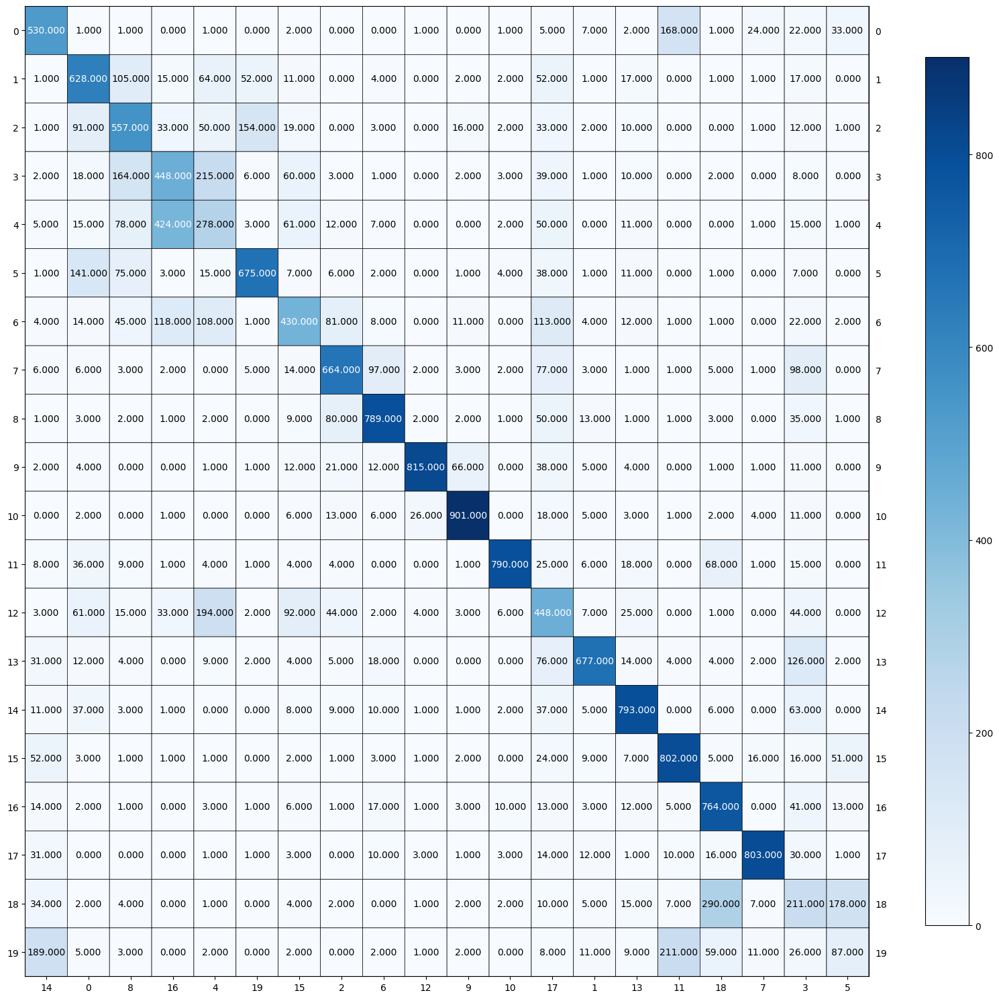

Homogeneity: 0.59541
Completeness: 0.59873
V-measure: 0.59707
Adjusted Rand Index: 0.4707
Adjusted Mutual Information Score: 0.59576


{'homogeneity': 0.59541,
 'completeness': 0.59873,
 'v_measure': 0.59707,
 'adjusted_rand_index': 0.4707,
 'adjusted_mutual_information': 0.59576}

In [38]:
r = 60  # a larger r seems to have better score
clustering_method = "kmeans"
k = 20

# set reducer
X_all_transformed = umap.UMAP(r, metric="cosine", random_state=SEED).fit_transform(X_all_tfidf)

# set cluster and get score
scores = run_evaluate_pipeline(
    X=X_all_transformed,
    y=y_all,
    pred_func=clustering_map[clustering_method],
    n_clusters=k,
    fig_size=(15, 15),
)
scores.pop("contingency_matrix")
scores

In [158]:
# Reference to: https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6

clustering_method = "kmeans"
k = 20

for model_name in ['all-mpnet-base-v2', 
                   'multi-qa-mpnet-base-dot-v1', 
                   'all-distilroberta-v1', 
                   'all-MiniLM-L12-v2', 
                   'multi-qa-distilbert-cos-v1']:
    print(f"runing {model_name=}")
    model = SentenceTransformer(model_name)
    X_embeddings = model.encode(X_all, show_progress_bar=True)
    scores = run_evaluate_pipeline(
                X=X_embeddings,
                y=y_all,
                pred_func=clustering_map[clustering_method],
                n_clusters=k,
                fig_size=(15, 15),
                plot_figure=False,
            )
    scores.pop("contingency_matrix")

runing model_name='all-mpnet-base-v2'


Batches:   0%|          | 0/589 [00:00<?, ?it/s]

Homogeneity: 0.62873
Completeness: 0.63965
V-measure: 0.63414
Adjusted Rand Index: 0.4687
Adjusted Mutual Information Score: 0.63295
runing model_name='multi-qa-mpnet-base-dot-v1'


Batches:   0%|          | 0/589 [00:00<?, ?it/s]

Homogeneity: 0.62062
Completeness: 0.62857
V-measure: 0.62457
Adjusted Rand Index: 0.47411
Adjusted Mutual Information Score: 0.62335
runing model_name='all-distilroberta-v1'


Batches:   0%|          | 0/589 [00:00<?, ?it/s]

Homogeneity: 0.56621
Completeness: 0.57526
V-measure: 0.5707
Adjusted Rand Index: 0.3958
Adjusted Mutual Information Score: 0.5693
runing model_name='all-MiniLM-L12-v2'


Batches:   0%|          | 0/589 [00:00<?, ?it/s]

Homogeneity: 0.55257
Completeness: 0.5614
V-measure: 0.55695
Adjusted Rand Index: 0.40053
Adjusted Mutual Information Score: 0.55551
runing model_name='multi-qa-distilbert-cos-v1'


Batches:   0%|          | 0/589 [00:00<?, ?it/s]

Homogeneity: 0.60373
Completeness: 0.61054
V-measure: 0.60712
Adjusted Rand Index: 0.46041
Adjusted Mutual Information Score: 0.60584


# Part 2 - Deep Learning and Clustering of Image Data

## Flowers Dataset and VGG Features

### QUESTION 19: In a brief paragraph discuss: If the VGG network is trained on a dataset with perhaps totally different classes as targets, why would one expect the features derived from such a network to have discriminative power for a custom dataset?
***
> Ans: <br>
The pre-trained models for CV, which have 1000 classes as training targets, are mostly trained for general purpose. Therefore, even though the target of the downstream task might be totally different, generated representations from pre-trained image models can be meaningful to describe the features of input images, which can be useful for transfer learning.

In [39]:
filename = './flowers_features_and_labels.npz'

if os.path.exists(filename):
    file = np.load(filename)
    f_all, y_all = file['f_all'], file['y_all']

else:
    if not os.path.exists('./flower_photos'):
        # download the flowers dataset and extract its images
        url = 'http://download.tensorflow.org/example_images/flower_photos.tgz'
        with open('./flower_photos.tgz', 'wb') as file:
            file.write(requests.get(url).content)
        with tarfile.open('./flower_photos.tgz') as file:
            file.extractall('./')
        os.remove('./flower_photos.tgz')

    class FeatureExtractor(nn.Module):
        def __init__(self):
            super().__init__()

            vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg16', pretrained=True)

            # Extract VGG-16 Feature Layers
            self.features = list(vgg.features)
            self.features = nn.Sequential(*self.features)
            # Extract VGG-16 Average Pooling Layer
            self.pooling = vgg.avgpool
            # Convert the image into one-dimensional vector
            self.flatten = nn.Flatten()
            # Extract the first part of fully-connected layer from VGG16
            self.fc = vgg.classifier[0]

        def forward(self, x):
            # It will take the input 'x' until it returns the feature vector called 'out'
            out = self.features(x)
            out = self.pooling(out)
            out = self.flatten(out)
            out = self.fc(out) 
            return out 

    # Initialize the model
    assert torch.cuda.is_available()
    feature_extractor = FeatureExtractor().cuda().eval()

    dataset = datasets.ImageFolder(
        root='./flower_photos',
        transform=transforms.Compose(
            [
                transforms.Resize(224),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                )
            ]
        ),
    )
    dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

    # Extract features and store them on disk
    f_all, y_all = np.zeros((0, 4096)), np.zeros((0,))
    for x, y in tqdm(dataloader):
        with torch.no_grad():
            f_all = np.vstack([f_all, feature_extractor(x.cuda()).cpu()])
            y_all = np.concatenate([y_all, y])
    np.savez(filename, f_all=f_all, y_all=y_all)

### QUESTION 20: In a brief paragraph explain how the helper code base is performing feature extraction.
***
> Ans: <br>
First when loading an image, the dataloader will do some transformations: resizing, cropping, and normalizing. Then it will feed the processed image to the pre-trained VGG16. Specifically, it will only take all the feature layers, an average pooling layer, and the first FC layer to generate the image feature.

### QUESTION 21: How many pixels are there in the original images? How many features does the VGG network extract per image; i.e what is the dimension of each feature vector for an image sample?
***
> Ans: <br>
Numbers of pixels are varied from different images, min=36480, max=200000 and mean=101919, while the number of features from VGG network is 4096.

In [40]:
print(f_all.shape, y_all.shape)
num_features = f_all.shape[1]

(3670, 4096) (3670,)


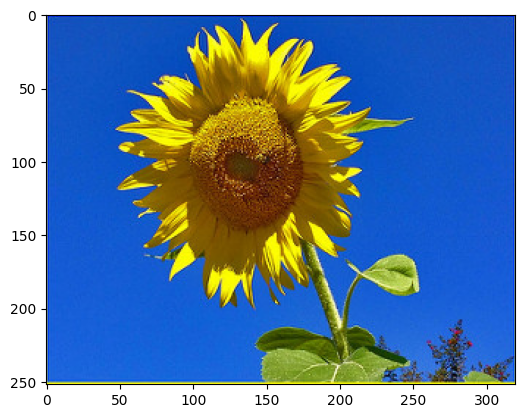

(252, 320, 3)


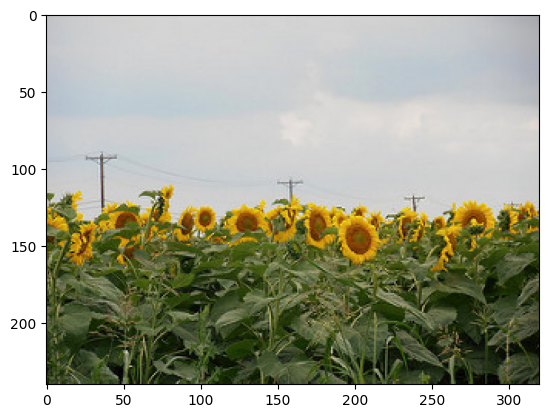

(240, 320, 3)


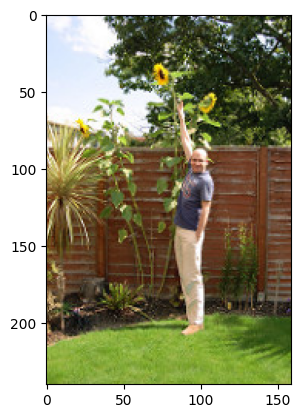

(240, 159, 3)


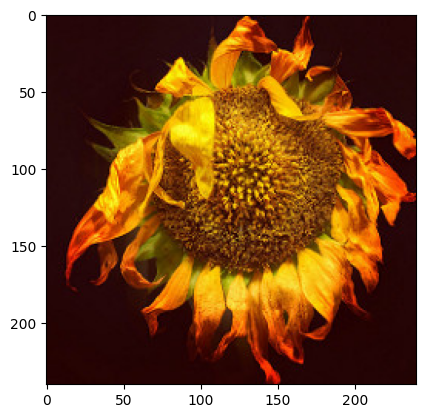

(240, 240, 3)


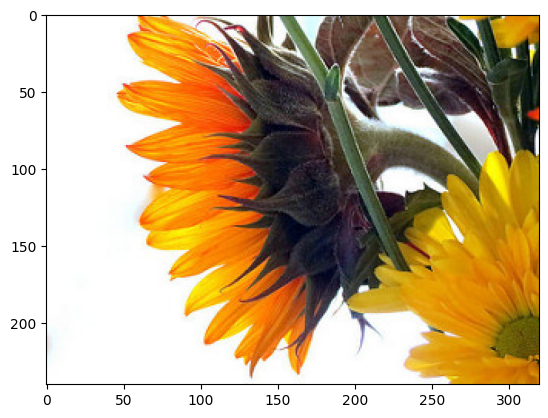

(240, 320, 3)


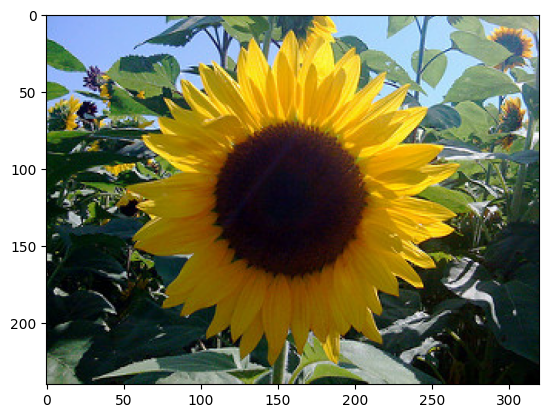

(240, 320, 3)


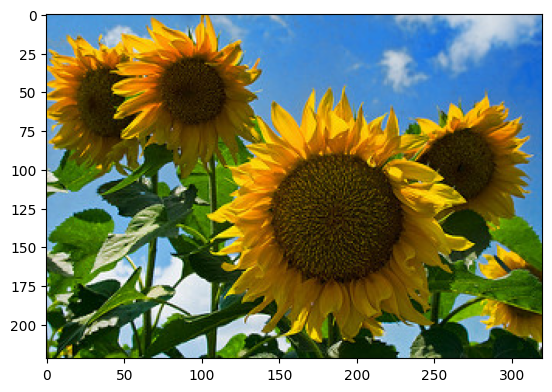

(222, 320, 3)


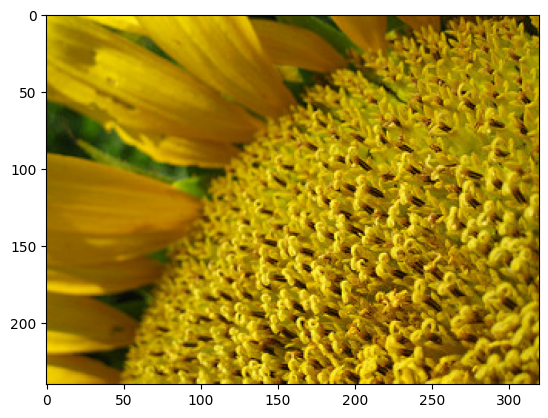

(240, 320, 3)


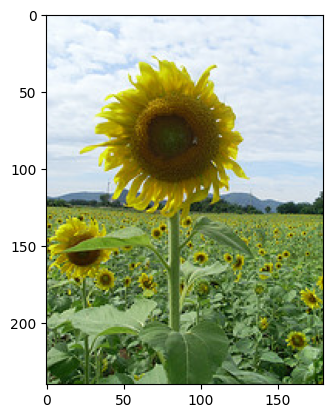

(240, 180, 3)


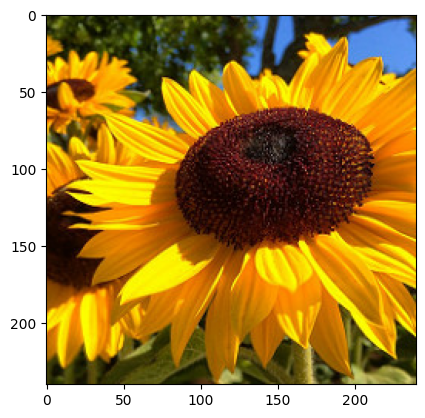

(240, 240, 3)


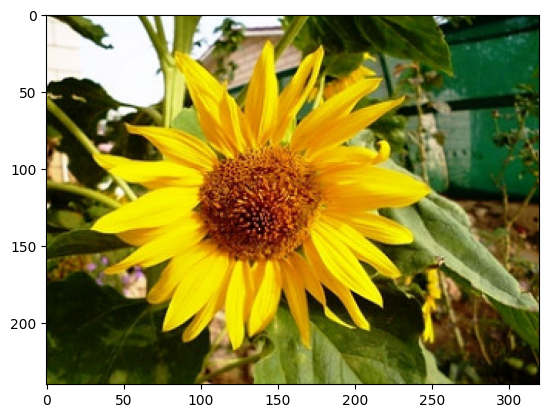

(240, 320, 3)


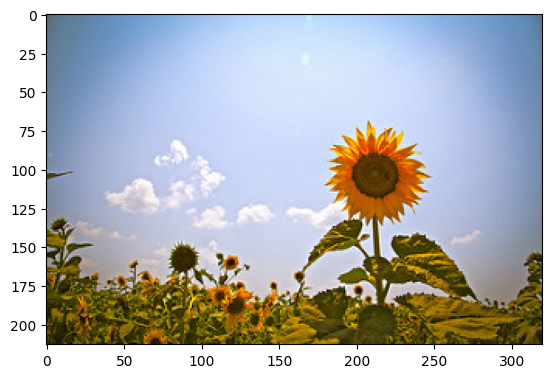

(213, 320, 3)


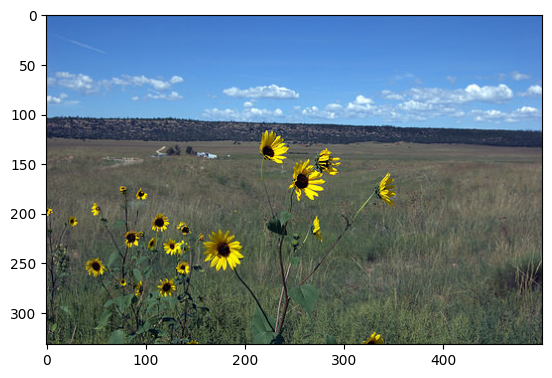

(332, 500, 3)


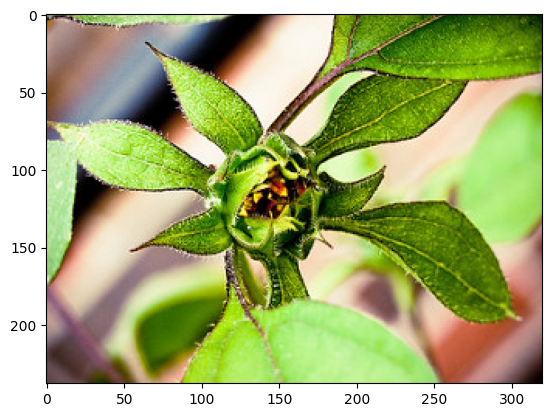

(238, 320, 3)


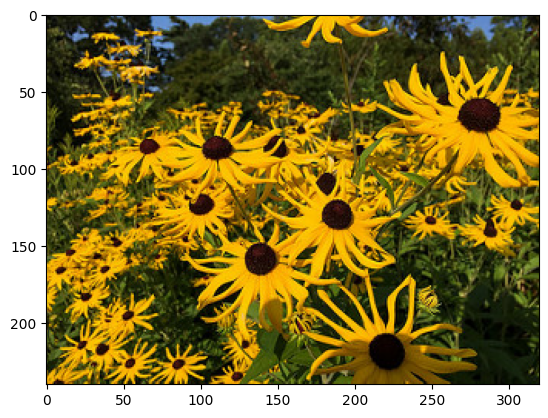

(240, 320, 3)


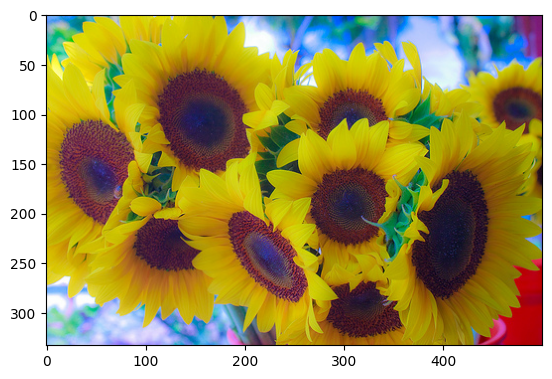

(333, 500, 3)


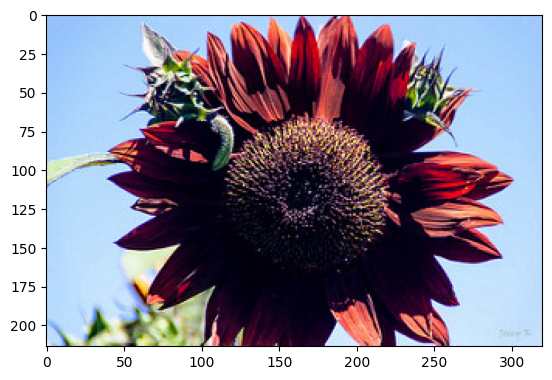

(214, 320, 3)


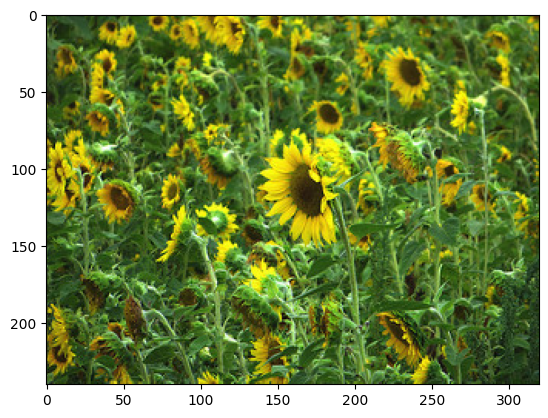

(240, 320, 3)


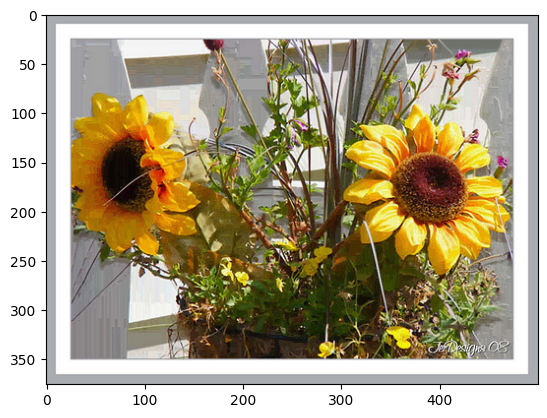

(376, 500, 3)


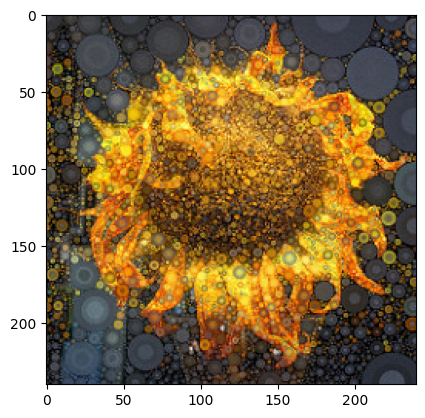

(240, 240, 3)


In [41]:
flower_img_folder = "flower_photos/sunflowers/"
sample_filenames = os.listdir(flower_img_folder)
imgs = [iio.imread(flower_img_folder + fn) for fn in sample_filenames]
for img in imgs[:20]:
    plt.imshow(img)
    plt.show()
    print(img.shape)

In [44]:
stats.describe([img.shape[0] * img.shape[1] for img in imgs])

DescribeResult(nobs=699, minmax=(36480, 200000), mean=101919.6852646638, variance=2468665067.522577, skewness=0.47706956868014405, kurtosis=-1.4227124775892257)

### QUESTION 22: Are the extracted features dense or sparse? (Compare with sparse TF-IDF features in text.)
***
> Ans: <br>
The extracted features are super dense with an average density of almost 100%, which is obviously way denser than that of TF-IDF's.

In [45]:
(f_all != 0).mean()

0.9999999334766689

### QUESTION 23: In order to inspect the high-dimensional features, t-SNE is a popular off-the-shelf choice for visualizing Vision features. Map the features you have extracted onto 2 dimensions with t-SNE. Then plot the mapped feature vectors along x and y axes. Color-code the data points with ground-truth labels. Describe your observation.
***
> Ans: <br>
As we can see in the figure below, the five classes can be roughly clustered even just by using the pre-trained image network to generate representations.

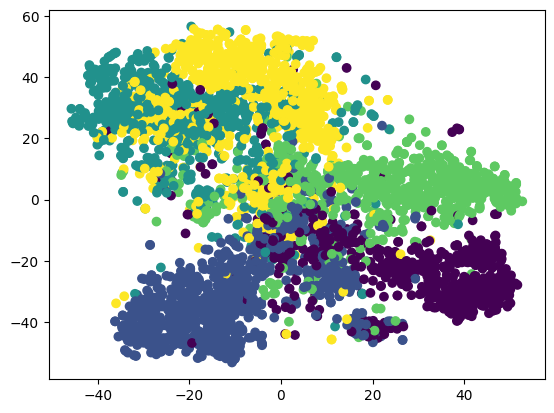

In [46]:
f_tsne = TSNE(n_components=2, random_state=SEED).fit_transform(f_all)
plt.scatter(*f_tsne.T, c=y_all)
plt.show()

# Autoencoder

In [47]:
class Autoencoder(torch.nn.Module, TransformerMixin):
    def __init__(self, n_components):
        super().__init__()
        self.n_components = n_components
        self.n_features = None  # to be determined with data
        self.encoder = None
        self.decoder = None
        
    def _create_encoder(self):
        return nn.Sequential(
            nn.Linear(4096, 1280),
            nn.ReLU(True),
            nn.Linear(1280, 640),
            nn.ReLU(True),
            nn.Linear(640, 120),
            nn.ReLU(True),
            nn.Linear(120, self.n_components),
        )
    
    def _create_decoder(self):
        return nn.Sequential(
            nn.Linear(self.n_components, 120),
            nn.ReLU(True),
            nn.Linear(120, 640),
            nn.ReLU(True),
            nn.Linear(640, 1280),
            nn.ReLU(True), nn.Linear(1280, 4096))
    
    def forward(self, X):
        encoded = self.encoder(X)
        decoded = self.decoder(encoded)
        return decoded
    
    def fit(self, X):
        X = torch.tensor(X, dtype=torch.float32, device='cuda')
        self.n_features = X.shape[1]
        self.encoder = self._create_encoder()
        self.decoder = self._create_decoder()
        self.cuda()
        self.train()
        
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3, weight_decay=1e-5)

        dataset = TensorDataset(X)
        dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

        for epoch in tqdm(range(100)):
            for (X_,) in dataloader:
                X_ = X_.cuda()
                # ===================forward=====================
                output = self(X_)
                loss = criterion(output, X_)
                # ===================backward====================
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        return self     
        
    def transform(self, X):
        X = torch.tensor(X, dtype=torch.float32, device='cuda')
        self.eval()
        with torch.no_grad():
            return self.encoder(X).cpu().numpy()

In [48]:
# 1. Dimensionality Reduction
print("Generate SVD features")
f_svd = TruncatedSVD(n_components=50, random_state=SEED).fit_transform(f_all)

print("Generate UMAP features")
f_umap = umap.UMAP(n_components=50, random_state=SEED).fit_transform(f_all)

print("Generate Autoencoder features")
f_ae = Autoencoder(n_components=50).fit_transform(f_all)

features = {
    "original": f_all,
    "svd": f_svd,
    "umap": f_umap,
    "autoencoder": f_ae,
}


# 2. Clustering
def test_all_clusterers(f_input):
    scores = {}

    print("testing K-Means")
    y_pred = KMeans(n_clusters=5, random_state=SEED).fit_predict(f_input)
    score = round(adjusted_rand_score(y_all, y_pred), 5)
    scores["kmeans"] = score
    print(f"{score=}\n")
    
    print("testing Agglomerative Clustering")
    y_pred = AgglomerativeClustering(n_clusters=5).fit_predict(f_input)
    score = round(adjusted_rand_score(y_all, y_pred), 5)
    scores["agglomerative"] = score
    print(f"{score=}\n")

    print("testing HDBSCANs")
    min_cluster_sizes = [5, 100, 200]
    min_sampless = [1, 5, 15]
    for min_cluster_size in min_cluster_sizes:
        for min_samples in min_sampless:
            print(f"- testing {min_cluster_size=}, {min_samples=}")
            y_pred = HDBSCAN(
                min_cluster_size=min_cluster_size, min_samples=min_samples
            ).fit_predict(f_input)
            score = round(adjusted_rand_score(y_all, y_pred), 5)
            scores[f"hdbscan_{min_cluster_size}_{min_samples}"] = score
            print(f"- {score=}\n")

    return scores

Generate SVD features
Generate UMAP features
Generate Autoencoder features


  0%|          | 0/100 [00:00<?, ?it/s]

In [49]:
feature2scores = {}

for f_name, f_input in features.items():
    print(f"testing dimensionality reduction method={f_name}")
    feature2scores[f_name] = test_all_clusterers(f_input)

scores = {
    f"{f_name}_{c_name}": v2
    for f_name, v1 in feature2scores.items()
    for c_name, v2 in v1.items()
}

scores

testing dimensionality reduction method=original
testing K-Means


/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


score=0.19105

testing Agglomerative Clustering
score=0.21845

testing HDBSCANs
- testing min_cluster_size=5, min_samples=1
- score=0.01498

- testing min_cluster_size=5, min_samples=5
- score=0.00668

- testing min_cluster_size=5, min_samples=15
- score=0.0

- testing min_cluster_size=100, min_samples=1
- score=0.0

- testing min_cluster_size=100, min_samples=5
- score=0.0

- testing min_cluster_size=100, min_samples=15
- score=0.0

- testing min_cluster_size=200, min_samples=1
- score=0.0

- testing min_cluster_size=200, min_samples=5
- score=0.0

- testing min_cluster_size=200, min_samples=15
- score=0.0

testing dimensionality reduction method=svd
testing K-Means


/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


score=0.19031

testing Agglomerative Clustering
score=0.20949

testing HDBSCANs
- testing min_cluster_size=5, min_samples=1
- score=0.02022

- testing min_cluster_size=5, min_samples=5
- score=0.006

- testing min_cluster_size=5, min_samples=15
- score=0.0

- testing min_cluster_size=100, min_samples=1
- score=0.0

- testing min_cluster_size=100, min_samples=5
- score=0.0

- testing min_cluster_size=100, min_samples=15
- score=0.0

- testing min_cluster_size=200, min_samples=1
- score=0.0

- testing min_cluster_size=200, min_samples=5
- score=0.0

- testing min_cluster_size=200, min_samples=15
- score=0.0

testing dimensionality reduction method=umap
testing K-Means


/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


score=0.41892

testing Agglomerative Clustering
score=0.37837

testing HDBSCANs
- testing min_cluster_size=5, min_samples=1
- score=0.01244

- testing min_cluster_size=5, min_samples=5
- score=0.0333

- testing min_cluster_size=5, min_samples=15
- score=0.12643

- testing min_cluster_size=100, min_samples=1
- score=0.35529

- testing min_cluster_size=100, min_samples=5
- score=0.35984

- testing min_cluster_size=100, min_samples=15
- score=0.21454

- testing min_cluster_size=200, min_samples=1
- score=0.39807

- testing min_cluster_size=200, min_samples=5
- score=0.23925

- testing min_cluster_size=200, min_samples=15
- score=0.26027

testing dimensionality reduction method=autoencoder
testing K-Means


/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


score=0.19794

testing Agglomerative Clustering
score=0.24928

testing HDBSCANs
- testing min_cluster_size=5, min_samples=1
- score=0.02931

- testing min_cluster_size=5, min_samples=5
- score=0.0042

- testing min_cluster_size=5, min_samples=15
- score=0.0

- testing min_cluster_size=100, min_samples=1
- score=0.0

- testing min_cluster_size=100, min_samples=5
- score=0.0

- testing min_cluster_size=100, min_samples=15
- score=0.0

- testing min_cluster_size=200, min_samples=1
- score=0.0

- testing min_cluster_size=200, min_samples=5
- score=0.0

- testing min_cluster_size=200, min_samples=15
- score=0.0



{'original_kmeans': 0.19105,
 'original_agglomerative': 0.21845,
 'original_hdbscan_5_1': 0.01498,
 'original_hdbscan_5_5': 0.00668,
 'original_hdbscan_5_15': 0.0,
 'original_hdbscan_100_1': 0.0,
 'original_hdbscan_100_5': 0.0,
 'original_hdbscan_100_15': 0.0,
 'original_hdbscan_200_1': 0.0,
 'original_hdbscan_200_5': 0.0,
 'original_hdbscan_200_15': 0.0,
 'svd_kmeans': 0.19031,
 'svd_agglomerative': 0.20949,
 'svd_hdbscan_5_1': 0.02022,
 'svd_hdbscan_5_5': 0.006,
 'svd_hdbscan_5_15': 0.0,
 'svd_hdbscan_100_1': 0.0,
 'svd_hdbscan_100_5': 0.0,
 'svd_hdbscan_100_15': 0.0,
 'svd_hdbscan_200_1': 0.0,
 'svd_hdbscan_200_5': 0.0,
 'svd_hdbscan_200_15': 0.0,
 'umap_kmeans': 0.41892,
 'umap_agglomerative': 0.37837,
 'umap_hdbscan_5_1': 0.01244,
 'umap_hdbscan_5_5': 0.0333,
 'umap_hdbscan_5_15': 0.12643,
 'umap_hdbscan_100_1': 0.35529,
 'umap_hdbscan_100_5': 0.35984,
 'umap_hdbscan_100_15': 0.21454,
 'umap_hdbscan_200_1': 0.39807,
 'umap_hdbscan_200_5': 0.23925,
 'umap_hdbscan_200_15': 0.26027,


In [50]:
best_result = max(scores.items(), key=lambda x: x[1])
print(f"best result: {best_result}")

best result: ('umap_kmeans', 0.41892)


### QUESTION 24: Report the best result (in terms of rand score) within the table below. For HDBSCAN, introduce a conservative parameter grid over `min_cluster_size` and `min_samples`.
***
> Ans: The best combination is:
> + Dimensionality Reduction: UMAP
> + Clustering: K-Means
> + Rand score: 0.41892

# MLP Classifier

In [51]:
class MLP(torch.nn.Module):
    def __init__(self, num_features):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(num_features, 1280),
            nn.ReLU(True),
            nn.Linear(1280, 640),
            nn.ReLU(True), 
            nn.Linear(640, 5),
            nn.LogSoftmax(dim=1),
        )
        self.cuda()
    
    
    def forward(self, X):
        return self.model(X)
    
    def train(self, X, y):
        X = torch.tensor(X, dtype=torch.float32, device='cuda')
        y = torch.tensor(y, dtype=torch.int64, device='cuda')

        self.model.train()
        
        criterion = nn.NLLLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3, weight_decay=1e-5)

        dataset = TensorDataset(X, y)
        dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

        for epoch in tqdm(range(100)):
            for (X_, y_) in dataloader:
                ##################################
                # you should implement this part #
                ##################################
                X_ = X_.cuda()
                # ===================forward=====================
                output = self(X_)
                loss = criterion(output, y_)
                # ===================backward====================
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        return self
    
    def evaluate(self, X_test, y_test):
        ##################################
        # you should implement this part #
        ##################################
        X = torch.tensor(X_test, dtype=torch.float32, device="cuda")
        self.model.eval()

        with torch.no_grad():
            probs = self.model(X)
            _, y_pred = torch.max(probs, 1)
            y_pred = y_pred.cpu().numpy()

        return (y_pred == y_test).mean()

In [52]:
def train_and_print_scores(X, y, train_idxs, test_idxs):
    # prepare training data
    X_train, y_train = X[train_idxs], y[train_idxs]
    X_test, y_test = X[test_idxs], y[test_idxs]
    
    # train classifier
    clf = MLP(X_train.shape[1])
    clf.train(X_train, y_train)
    
    # evaluate
    train_acc = round(clf.evaluate(X_train, y_train), 5)
    test_acc = round(clf.evaluate(X_test, y_test), 5)
    print(f"{train_acc=}, {test_acc=}")

In [53]:
# split training and testing data
N = len(f_all)
test_ratio = 0.2
n_test = round(N * test_ratio)

all_idxs = list(range(N))
random.seed(SEED)
random.shuffle(all_idxs)
train_idxs, test_idxs = all_idxs[: -n_test], all_idxs[-n_test: ]


for f_name, f_input in features.items():
    print(f"test on the {f_name} features")
    train_and_print_scores(f_input, y_all, train_idxs, test_idxs)

test on the original features


  0%|          | 0/100 [00:00<?, ?it/s]

train_acc=0.99966, test_acc=0.89237
test on the svd features


  0%|          | 0/100 [00:00<?, ?it/s]

train_acc=0.99966, test_acc=0.89646
test on the umap features


  0%|          | 0/100 [00:00<?, ?it/s]

train_acc=0.81505, test_acc=0.81063
test on the autoencoder features


  0%|          | 0/100 [00:00<?, ?it/s]

train_acc=0.99966, test_acc=0.89918


### QUESTION 25: Report the test accuracy of the MLP classifier on the original VGG features. Report the same when using the reduced-dimension features (you have freedom in choosing the dimensionality reduction algorithm and its parameters). Does the performance of the model suffer with the reduced-dimension representations? Is it significant? Does the success in classification make sense in the context of the clustering results obtained for the same features in Question 24.
***
> Ans: <br>
The test accuracies can be seen in the output of the above cell. Only the performance of the model trained with **UMAP** features, **which has the best clustering score**, significantly **dropped**. In conclusion, the success in the context of the clustering results does not mean that it can be helpful for the classification task.